# Importing Libraries

In [1]:
import numpy as np
import cv2
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import os
from glob import glob
import torchvision
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor
from PIL import Image
from torch.nn import functional as F

# Loading Dataset

In [2]:
Data_path = "/kaggle/input/lyft-udacity-challenge"
Train_images = glob(os.path.join(Data_path,"dataA/dataA/CameraRGB")+"/*.png")
Train_masks = glob(os.path.join(Data_path,"dataA/dataA/CameraSeg")+"/*.png")

In [3]:
print(len(Train_images))
print(len(Train_masks))

1000
1000


# Converting to pandas dataframe

In [4]:
df = pd.DataFrame({'Images': Train_images, 'Labels': Train_masks})
df.sort_values(by='Images', inplace = True)
df.reset_index(drop =True, inplace=True)
df.head()

,Images,Labels
0,/kaggle/input/lyft-udacity-challenge/dataA/dat...,/kaggle/input/lyft-udacity-challenge/dataA/dat...
1,/kaggle/input/lyft-udacity-challenge/dataA/dat...,/kaggle/input/lyft-udacity-challenge/dataA/dat...
2,/kaggle/input/lyft-udacity-challenge/dataA/dat...,/kaggle/input/lyft-udacity-challenge/dataA/dat...
3,/kaggle/input/lyft-udacity-challenge/dataA/dat...,/kaggle/input/lyft-udacity-challenge/dataA/dat...
4,/kaggle/input/lyft-udacity-challenge/dataA/dat...,/kaggle/input/lyft-udacity-challenge/dataA/dat...


# Custom class for dataset

In [5]:
class CustomDatasetFromImages(Dataset):
    def __init__(self, data_info):
        self.data_info = data_info
        self.image_arr = self.data_info.iloc[:, 0]
        self.label_arr = self.data_info.iloc[:, 1]
        self.data_len = len(self.data_info.index)

    def __getitem__(self, index):
        img = np.asarray(Image.open(self.image_arr[index])).astype('float')
        img = torch.as_tensor(img)/255.
        img = img.unsqueeze(0).permute(0,3,1,2)
        img = F.interpolate(input=img,size=256,align_corners=False,mode='bicubic')
        
        lab = np.asarray(plt.imread(self.label_arr[index])).astype('float')[:,:,0]*255
        lab = torch.as_tensor(lab).unsqueeze(0)
        lab = lab.unsqueeze(0)
        lab = F.interpolate(input=lab,size=256,mode='nearest')

        return (img.float(), lab.float())

    def __len__(self):
        return self.data_len

In [6]:
from sklearn.model_selection import train_test_split

X_train, X_test = train_test_split(df,test_size=0.2)
X_train, X_val = train_test_split(X_train,test_size =0.2)
X_train.reset_index(drop=True,inplace=True)
X_val.reset_index(drop=True,inplace=True)
X_test.reset_index(drop=True,inplace=True)

print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(640, 2)
(160, 2)
(200, 2)


In [41]:
train_data = CustomDatasetFromImages(X_train)
print(len(train_data))
val_data = CustomDatasetFromImages(X_val)
print(len(val_data))
test_data = CustomDatasetFromImages(X_test)
print(len(test_data))

640
160
200


In [42]:
train_data_loader = DataLoader(train_data,batch_size=1,shuffle=True)
val_data_loader = DataLoader(val_data, batch_size =1,shuffle = False)
test_data_loader = DataLoader(test_data,batch_size=1,shuffle=False)

In [44]:
print(len(train_data))
print(len(val_data))
train_data_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_data_loader = DataLoader(val_data, batch_size =32,shuffle = False)
batch = next(iter(train_data_loader))
image_batch_shape = batch[0].shape
label_batch_shape = batch[1].shape
print("Image batch shape:", image_batch_shape)
print("Label batch shape:", label_batch_shape)
batch = next(iter(val_data_loader))
image_batch_shape = batch[0].shape
label_batch_shape = batch[1].shape
print("Image batch shape:", image_batch_shape)
print("Label batch shape:", label_batch_shape)

640
160
Image batch shape: torch.Size([32, 1, 3, 256, 256])
Label batch shape: torch.Size([32, 1, 1, 256, 256])
Image batch shape: torch.Size([32, 1, 3, 256, 256])
Label batch shape: torch.Size([32, 1, 1, 256, 256])


# Defining Loss Function

In [54]:
def dice_loss(output, target, weights=None, ignore_index=None):
    eps = 0.0001
    output = output.float().exp()
    target = target.type(torch.int64)
    encoded_target = output.detach() * 0
    if ignore_index is not None:
        mask = target == ignore_index
        target = target.clone()
        target[mask] = 0
        encoded_target.scatter_(1, target.unsqueeze(1), 1)
        mask = mask.unsqueeze(1).expand_as(encoded_target)
        encoded_target[mask] = 0
    else:
        encoded_target.scatter_(1, target.unsqueeze(1), 1)

    if weights is None:
        weights = 1

    intersection = output * encoded_target
    numerator = 2 * intersection.sum(0).sum(1).sum(1)
    denominator = output + encoded_target

    if ignore_index is not None:
        denominator[mask] = 0
    denominator = denominator.sum(0).sum(1).sum(1) + eps
    loss_per_channel = weights * (1 - (numerator / denominator))

    return loss_per_channel.sum() / output.size(1)
# import torch

# def dice_loss(output, target, weights=None, ignore_index=None):
#     eps = 0.0001
#     smooth = 1  # Smoothing factor for numerical stability
#     output = torch.sigmoid(output)  # Apply sigmoid activation to convert logits to probabilities

#     # Flatten the output and target tensors
#     output = output.view(output.size(0), -1)
#     target = target.view(target.size(0), -1)

#     # Create a one-hot encoded target tensor
#     target_one_hot = torch.zeros_like(output)
#     if ignore_index is not None:
#         mask = target != ignore_index
#         target = target * mask
#     target_one_hot.scatter_(1, target, 1)

#     # Calculate intersection and union
#     intersection = torch.sum(output * target_one_hot, dim=1)
#     union = torch.sum(output, dim=1) + torch.sum(target_one_hot, dim=1)

#     # Calculate dice coefficient per channel
#     dice_coefficient = (2 * intersection + smooth) / (union + smooth)
    
#     # Apply weights if provided
#     if weights is not None:
#         dice_coefficient *= weights

#     # Calculate average dice loss across channels
#     loss = 1 - torch.mean(dice_coefficient)

#     return loss
# import torch

# def dice_loss(output, target, weights=None, ignore_index=None):
#     eps = 0.0001
#     smooth = 1  # Smoothing factor for numerical stability
#     output = torch.sigmoid(output)  # Apply sigmoid activation to convert logits to probabilities

#     # Flatten the output and target tensors
#     output = output.view(output.size(0), -1)
#     target = target.view(target.size(0), -1)

#     # Create a one-hot encoded target tensor
#     target_one_hot = torch.zeros_like(output)
#     if ignore_index is not None:
#         mask = target != ignore_index
#         target = target * mask
#     target_one_hot.scatter_(1, target.long(), 1)  # Convert target to int64 using long()

#     # Calculate intersection and union
#     intersection = torch.sum(output * target_one_hot, dim=1)
#     union = torch.sum(output, dim=1) + torch.sum(target_one_hot, dim=1)

#     # Calculate dice coefficient per channel
#     dice_coefficient = (2 * intersection + smooth) / (union + smooth)
    
#     # Apply weights if provided
#     if weights is not None:
#         dice_coefficient *= weights

#     # Calculate average dice loss across channels
#     loss = 1 - torch.mean(dice_coefficient)

#     return loss


# Defining U-Net architecture model

In [55]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()

        # Encoder
        self.encoder1 = self.double_conv(3, 64)
        self.encoder2 = self.double_conv(64, 128)
        self.encoder3 = self.double_conv(128, 256)
        self.encoder4 = self.double_conv(256, 512)

        # Center
        self.center = self.double_conv(512, 1024)

        # Decoder
        self.decoder4 = self.double_conv(1024, 512)
        self.decoder3 = self.double_conv(512, 256)
        self.decoder2 = self.double_conv(256, 128)
        self.decoder1 = self.double_conv(128, 64)

        # Upconvolutional layers
        self.upconv4 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.upconv3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.upconv1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)

        # Output
        self.final_conv = nn.Conv2d(64, out_channels, kernel_size=1)

    def double_conv(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder
        x = x.permute(1,0,2,3)
        enc1 = self.encoder1(x)
        enc2 = F.max_pool2d(enc1, 2)
        enc2 = self.encoder2(enc2)
        enc3 = F.max_pool2d(enc2, 2)
        enc3 = self.encoder3(enc3)
        enc4 = F.max_pool2d(enc3, 2)
        enc4 = self.encoder4(enc4)

        # Center
        center = F.max_pool2d(enc4, 2)
        center = self.center(center)

        # Decoder
        dec4 = self.upconv4(center)
        dec4 = torch.cat([enc4, dec4], dim=1)
        dec4 = self.decoder4(dec4)
        dec3 = self.upconv3(dec4)
        dec3 = torch.cat([enc3, dec3], dim=1)
        dec3 = self.decoder3(dec3)
        dec2 = self.upconv2(dec3)
        dec2 = torch.cat([enc2, dec2], dim=1)
        dec2 = self.decoder2(dec2)
        dec1 = self.upconv1(dec2)
        dec1 = torch.cat([enc1, dec1], dim=1)
        dec1 = self.decoder1(dec1)

        # Output
        output = self.final_conv(dec1)
        output = F.softmax(output, dim=1)

        return output


In [56]:
model = UNet(3,13)
model = model.float()
model = model.cuda()
model

UNet(
  (encoder1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (encoder2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (encoder3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=T

# Training Loop

Epoch 1, loss:  0.8447785943746566
Epoch 1, validation loss:  0.8221763968467712


<Figure size 640x480 with 0 Axes>

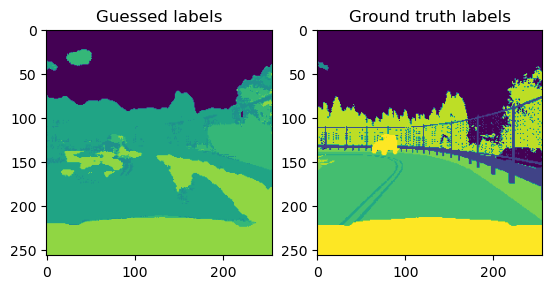

Epoch 2, loss:  0.820839735865593
Epoch 2, validation loss:  0.8095740079879761


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

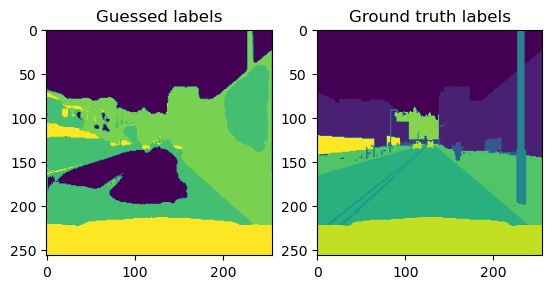

Epoch 3, loss:  0.8040840744972229
Epoch 3, validation loss:  0.7935137152671814


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

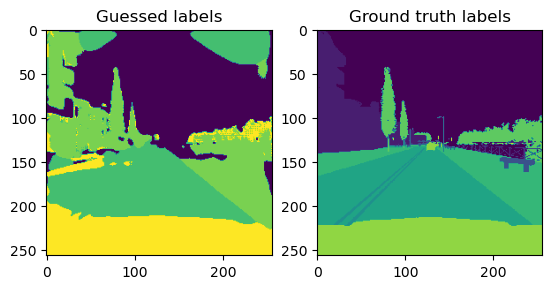

Epoch 4, loss:  0.799228721857071
Epoch 4, validation loss:  0.7901118397712708


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

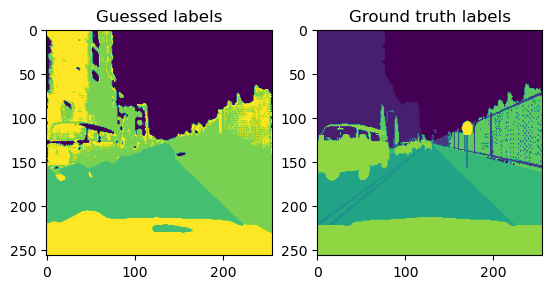

Epoch 5, loss:  0.7892078310251236
Epoch 5, validation loss:  0.7874968647956848


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

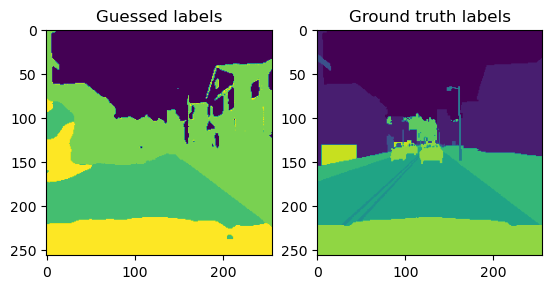

Epoch 6, loss:  0.7834818810224533
Epoch 6, validation loss:  0.7844875454902649


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

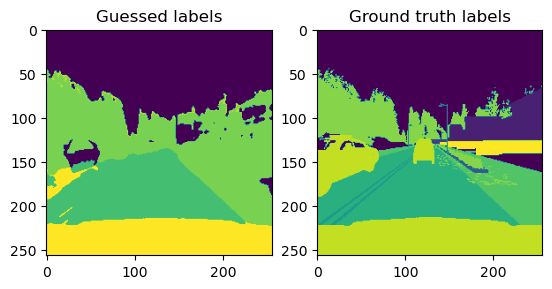

Epoch 7, loss:  0.7834085881710052
Epoch 7, validation loss:  0.7843399047851562


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

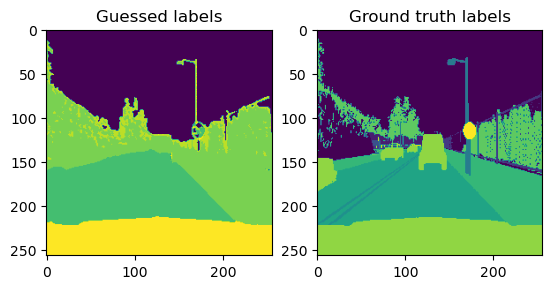

Epoch 8, loss:  0.7809684187173843
Epoch 8, validation loss:  0.7828330993652344


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

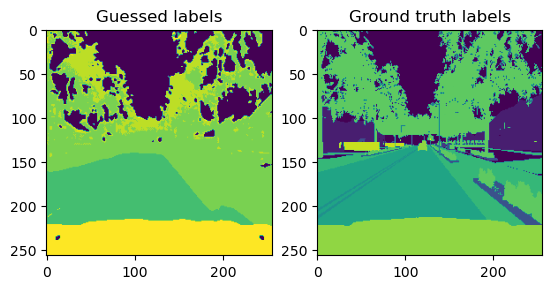

Epoch 9, loss:  0.7816263705492019
Epoch 9, validation loss:  0.7819874286651611


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

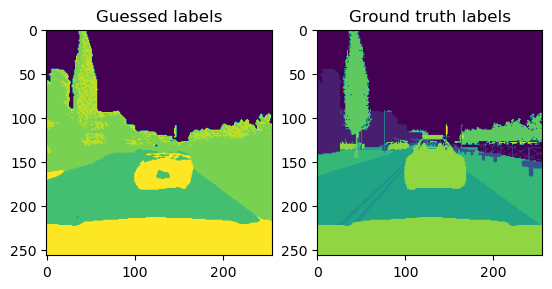

Epoch 10, loss:  0.777707988023758
Epoch 10, validation loss:  0.7812196612358093


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

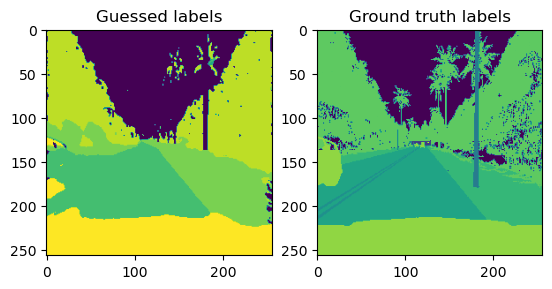

Epoch 11, loss:  0.7749650597572326
Epoch 11, validation loss:  0.7744306921958923


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

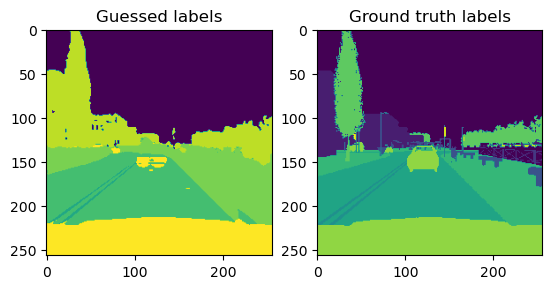

Epoch 12, loss:  0.771054458618164
Epoch 12, validation loss:  0.771369218826294


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

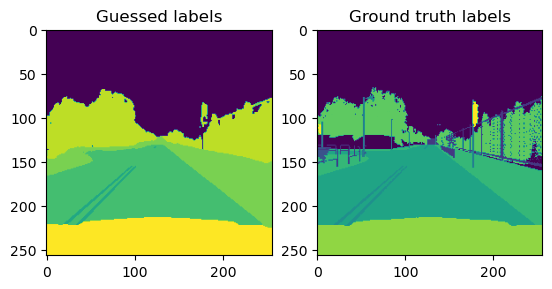

Epoch 13, loss:  0.7696021735668183
Epoch 13, validation loss:  0.7645955681800842


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

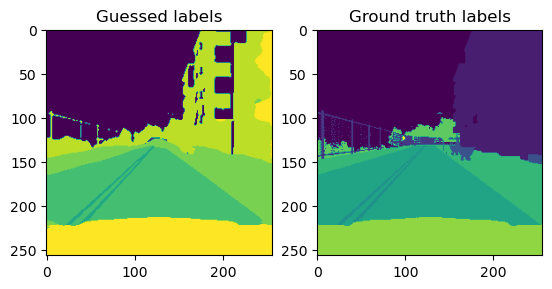

Epoch 14, loss:  0.765750253200531
Epoch 14, validation loss:  0.7624323964118958


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

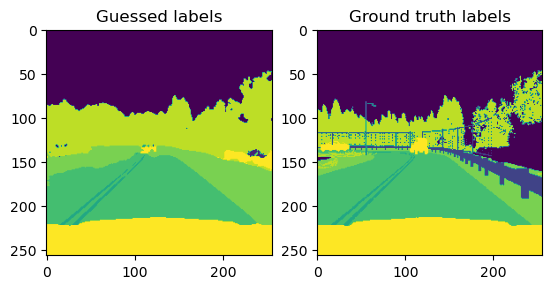

Epoch 15, loss:  0.763898977637291
Epoch 15, validation loss:  0.7631020545959473


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

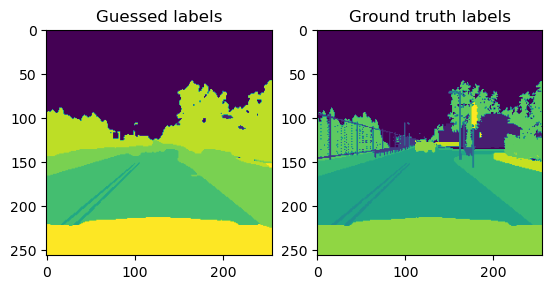

Epoch 16, loss:  0.7627106130123138
Epoch 16, validation loss:  0.7644932270050049


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

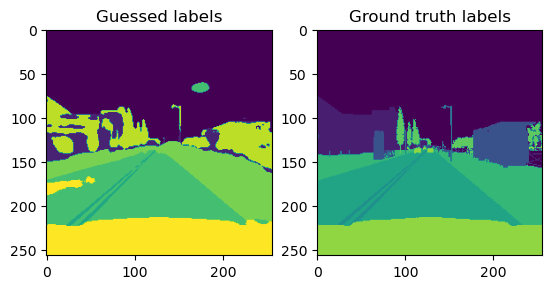

Epoch 17, loss:  0.7609019249677658
Epoch 17, validation loss:  0.7611141204833984


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

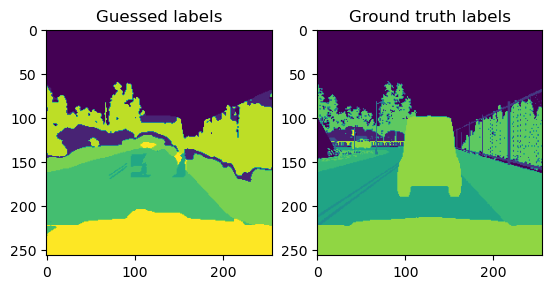

Epoch 18, loss:  0.7568407088518143
Epoch 18, validation loss:  0.7558661699295044


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

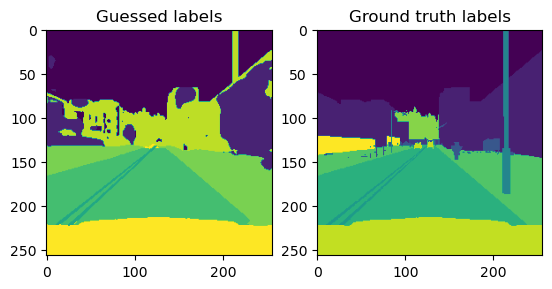

Epoch 19, loss:  0.7560440272092819
Epoch 19, validation loss:  0.7594640851020813


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

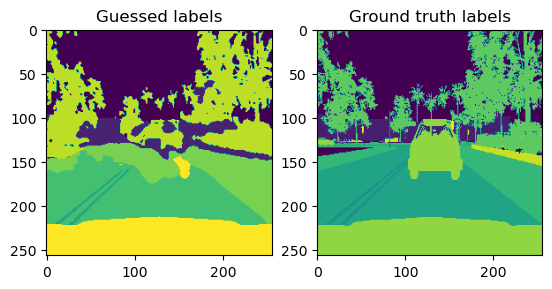

Epoch 20, loss:  0.7576510429382324
Epoch 20, validation loss:  0.7576534748077393


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

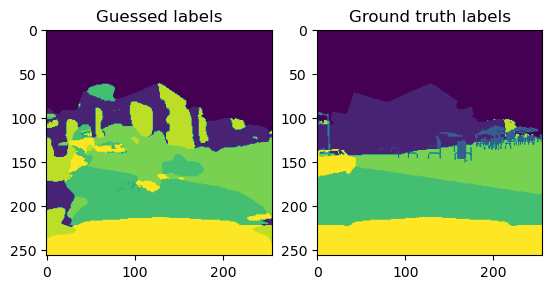

Epoch 21, loss:  0.7541764050722122
Epoch 21, validation loss:  0.757307231426239


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

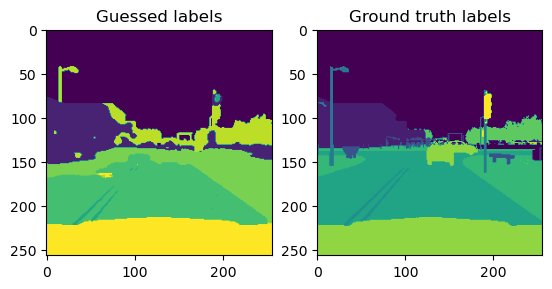

Epoch 22, loss:  0.7543198883533477
Epoch 22, validation loss:  0.7566654682159424


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

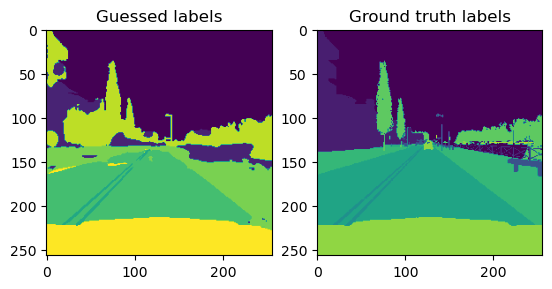

Epoch 23, loss:  0.7506867855787277
Epoch 23, validation loss:  0.7564317584037781


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

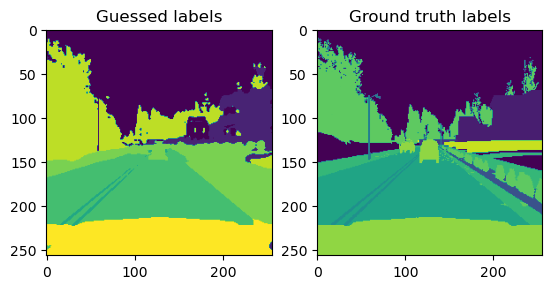

Epoch 24, loss:  0.7555632531642914
Epoch 24, validation loss:  0.7575870156288147


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

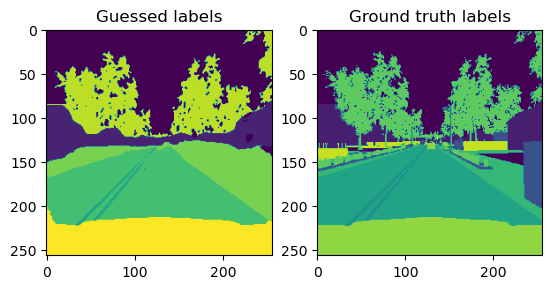

Epoch 25, loss:  0.7495142579078674
Epoch 25, validation loss:  0.7538409233093262


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

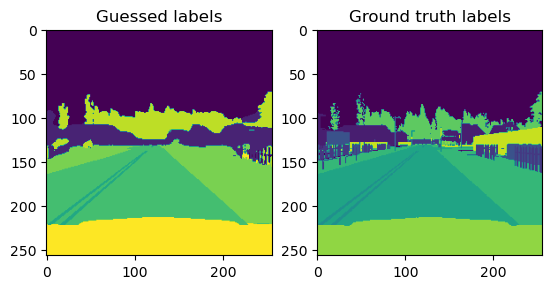

Epoch 26, loss:  0.7533435076475143
Epoch 26, validation loss:  0.7560709714889526


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

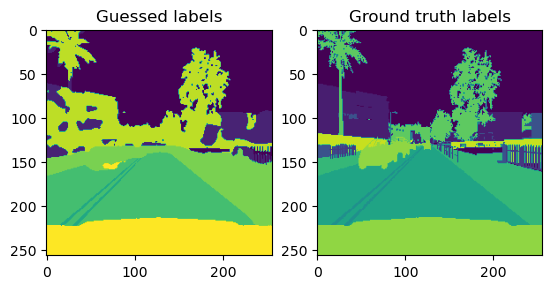

Epoch 27, loss:  0.752678605914116
Epoch 27, validation loss:  0.7553237080574036


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

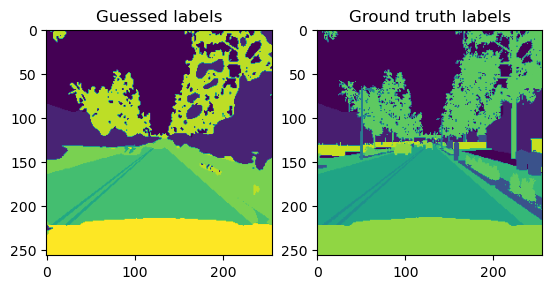

Epoch 28, loss:  0.7491520017385482
Epoch 28, validation loss:  0.7545473575592041


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

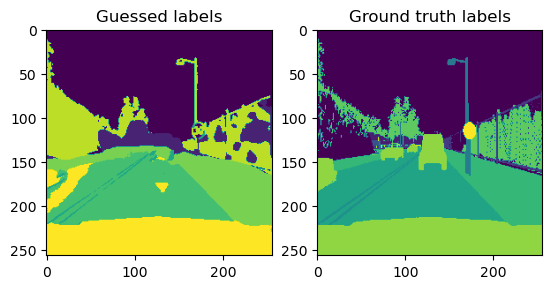

Epoch 29, loss:  0.7513542503118515
Epoch 29, validation loss:  0.7535293698310852


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

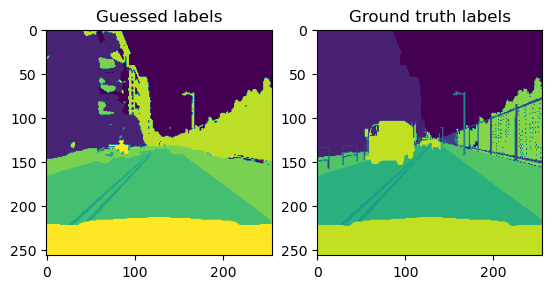

Epoch 30, loss:  0.7478721439838409
Epoch 30, validation loss:  0.7508350014686584


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

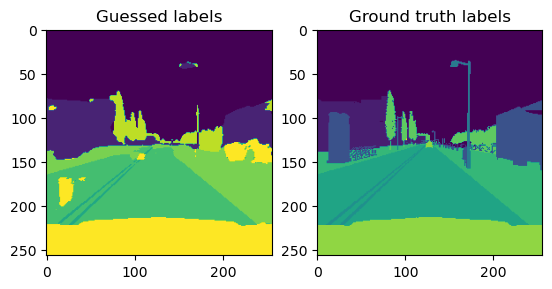

Epoch 31, loss:  0.7532375514507293
Epoch 31, validation loss:  0.7520784735679626


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

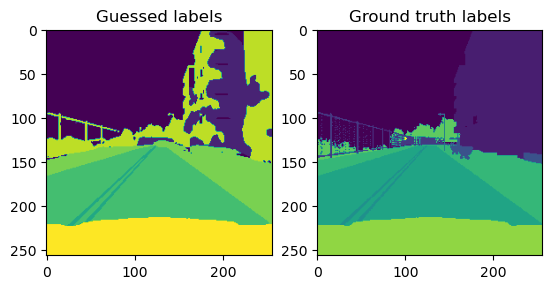

Epoch 32, loss:  0.7509964764118194
Epoch 32, validation loss:  0.7523326873779297


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

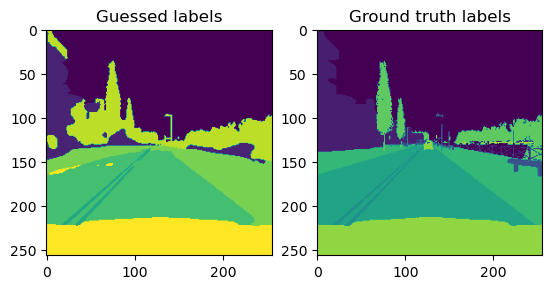

Epoch 33, loss:  0.748825940489769
Epoch 33, validation loss:  0.7519567012786865


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

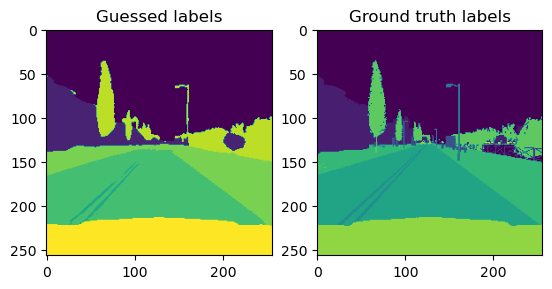

Epoch 34, loss:  0.7449585676193238
Epoch 34, validation loss:  0.7504839897155762


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

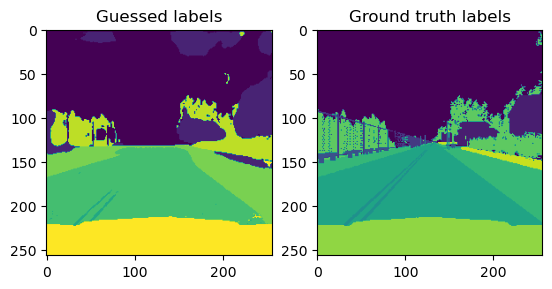

Epoch 35, loss:  0.7475768893957138
Epoch 35, validation loss:  0.7506492733955383


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

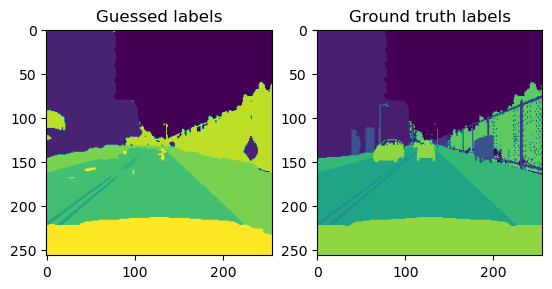

Epoch 36, loss:  0.7470314353704453
Epoch 36, validation loss:  0.7504842877388


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

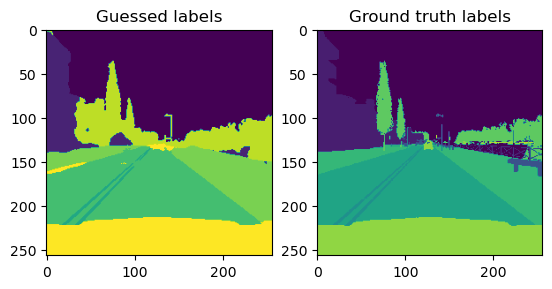

Epoch 37, loss:  0.7496447563171387
Epoch 37, validation loss:  0.7485146522521973


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

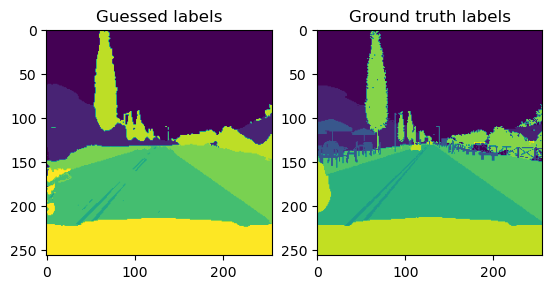

Epoch 38, loss:  0.7471457600593567
Epoch 38, validation loss:  0.7530331611633301


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

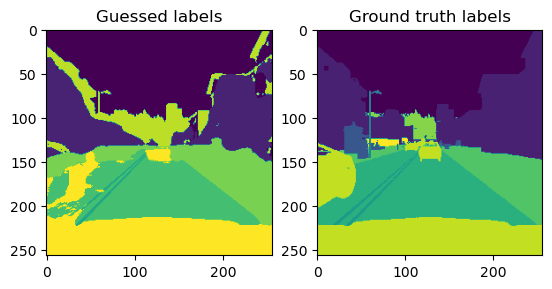

Epoch 39, loss:  0.7462335824966431
Epoch 39, validation loss:  0.7524164915084839


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

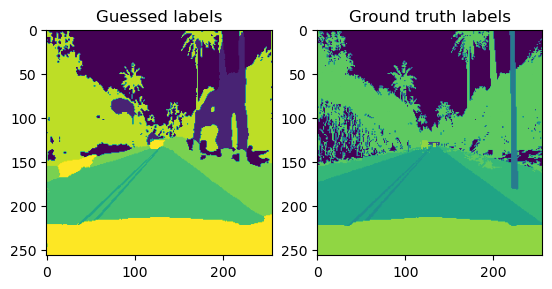

Epoch 40, loss:  0.7472090512514115
Epoch 40, validation loss:  0.7507507801055908


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

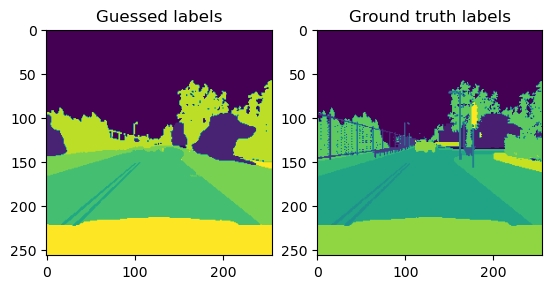

Epoch 41, loss:  0.7450467854738235
Epoch 41, validation loss:  0.7506474852561951


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

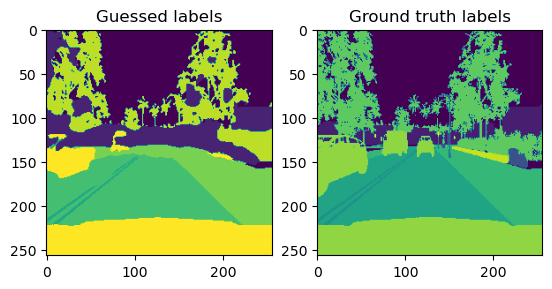

Epoch 42, loss:  0.7470938801765442
Epoch 42, validation loss:  0.7528705596923828


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

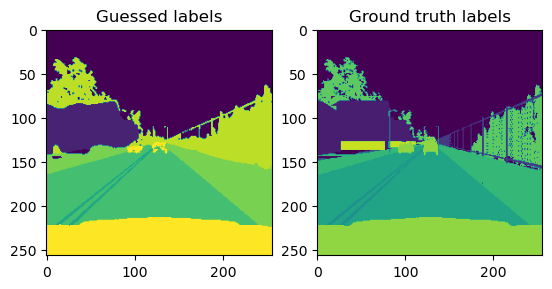

Epoch 43, loss:  0.7491509675979614
Epoch 43, validation loss:  0.7507656216621399


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

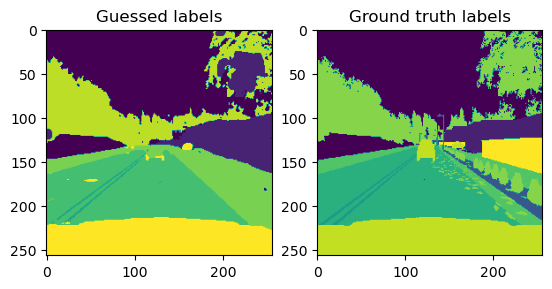

Epoch 44, loss:  0.7481006741523742
Epoch 44, validation loss:  0.7507307529449463


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

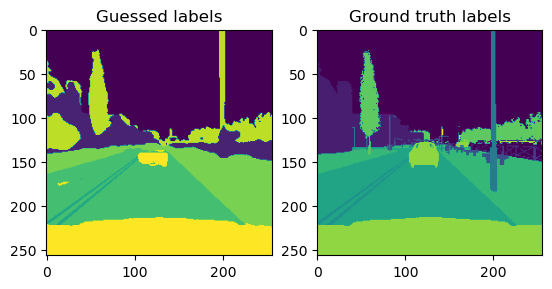

Epoch 45, loss:  0.7449338048696518
Epoch 45, validation loss:  0.7512022256851196


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

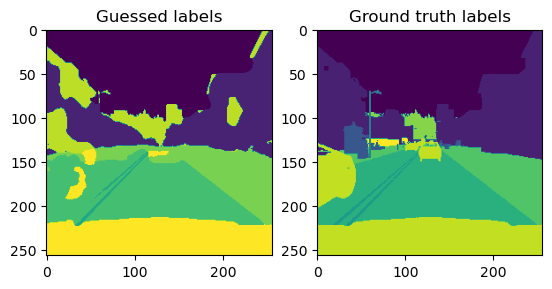

Epoch 46, loss:  0.7440120279788971
Epoch 46, validation loss:  0.7499579191207886


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

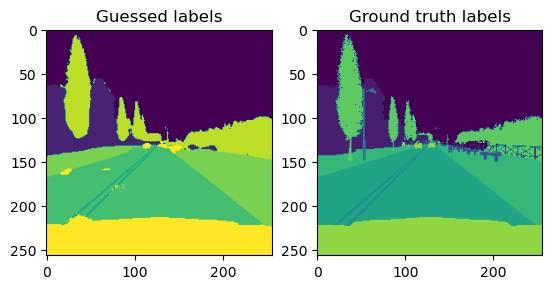

Epoch 47, loss:  0.74808469414711
Epoch 47, validation loss:  0.7502199411392212


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

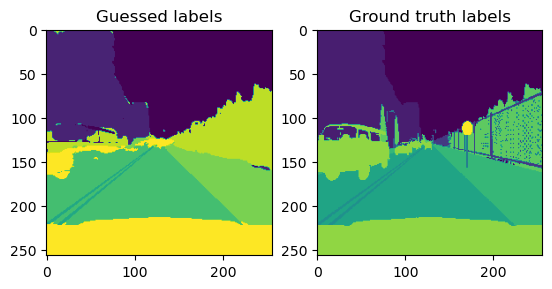

Epoch 48, loss:  0.7426638573408126
Epoch 48, validation loss:  0.7500746846199036


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

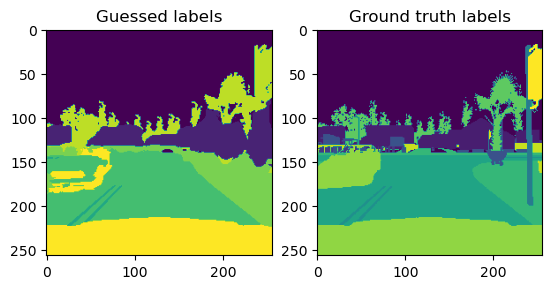

Epoch 49, loss:  0.7444623857736588
Epoch 49, validation loss:  0.7490938901901245


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

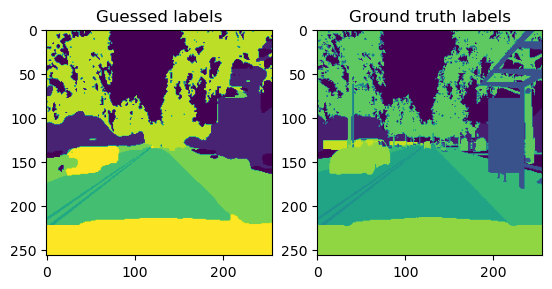

Epoch 50, loss:  0.7474080175161362
Epoch 50, validation loss:  0.7495774626731873


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

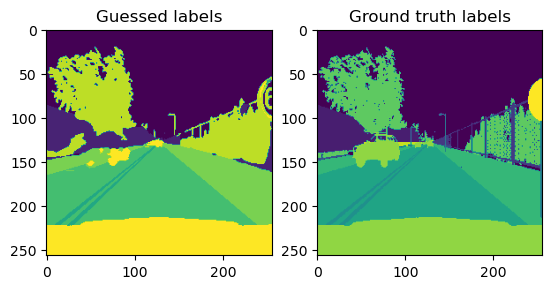

Epoch 51, loss:  0.7453686207532882
Epoch 51, validation loss:  0.750613808631897


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

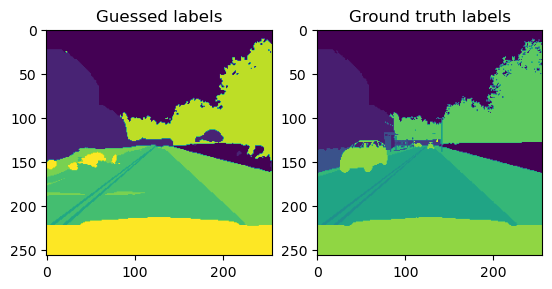

Epoch 52, loss:  0.7456099063158035
Epoch 52, validation loss:  0.7495352029800415


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

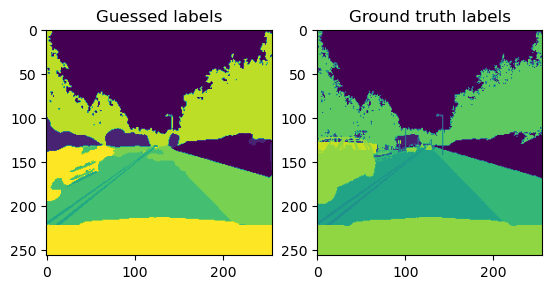

Epoch 53, loss:  0.7464906096458435
Epoch 53, validation loss:  0.7501163482666016


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

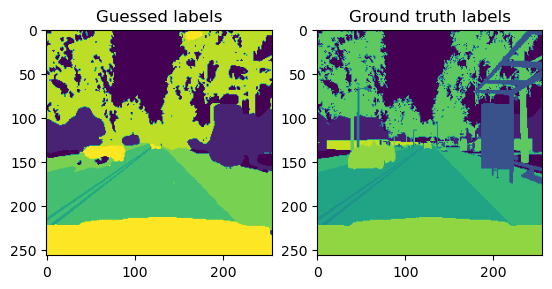

Epoch 54, loss:  0.7439973473548889
Epoch 54, validation loss:  0.7471936345100403


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

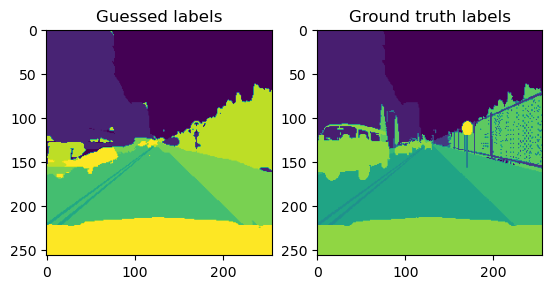

Epoch 55, loss:  0.7422380864620208
Epoch 55, validation loss:  0.7493774890899658


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

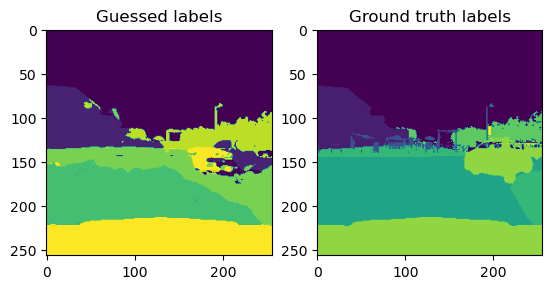

Epoch 56, loss:  0.7443153530359268
Epoch 56, validation loss:  0.7503485083580017


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

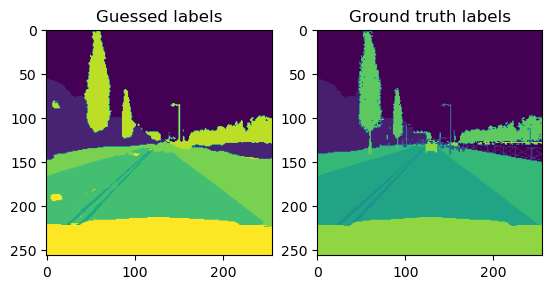

Epoch 57, loss:  0.742554533481598
Epoch 57, validation loss:  0.7505910396575928


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

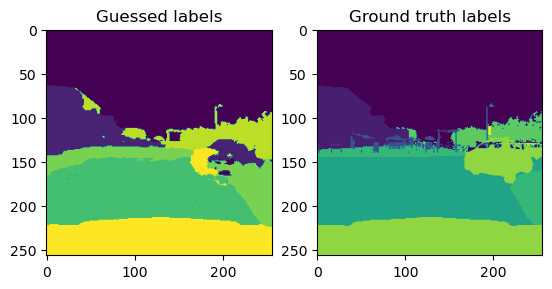

Epoch 58, loss:  0.7421346455812454
Epoch 58, validation loss:  0.7499168515205383


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

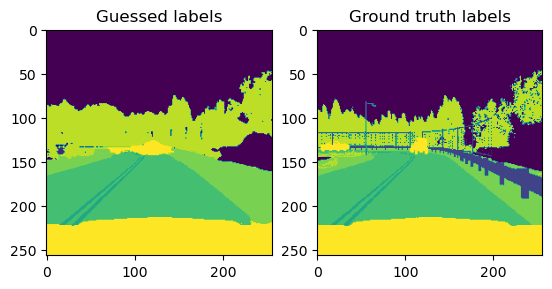

Epoch 59, loss:  0.746789300441742
Epoch 59, validation loss:  0.750404953956604


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

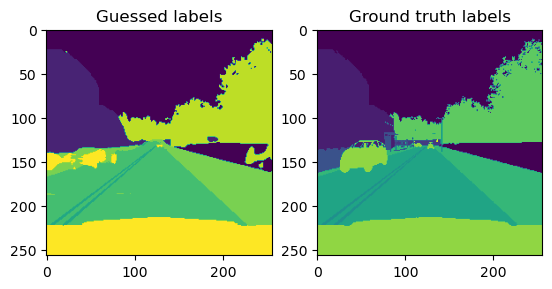

Epoch 60, loss:  0.7438800394535064
Epoch 60, validation loss:  0.7501375675201416


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

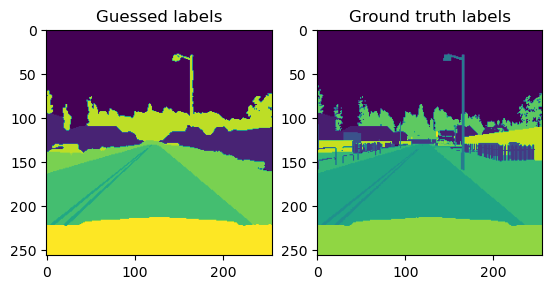

Epoch 61, loss:  0.7475761026144028
Epoch 61, validation loss:  0.7507137656211853


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

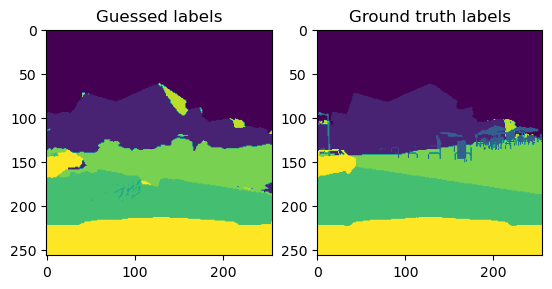

Epoch 62, loss:  0.7450650006532669
Epoch 62, validation loss:  0.7507345080375671


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

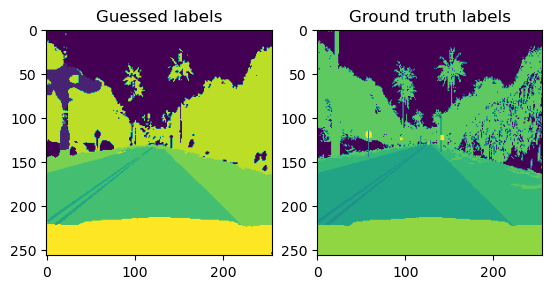

Epoch 63, loss:  0.74680115878582
Epoch 63, validation loss:  0.7511408925056458


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

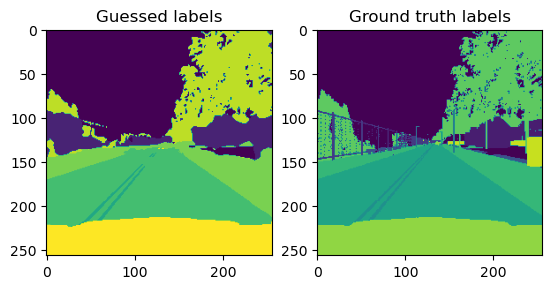

Epoch 64, loss:  0.7452975988388062
Epoch 64, validation loss:  0.7526874542236328


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

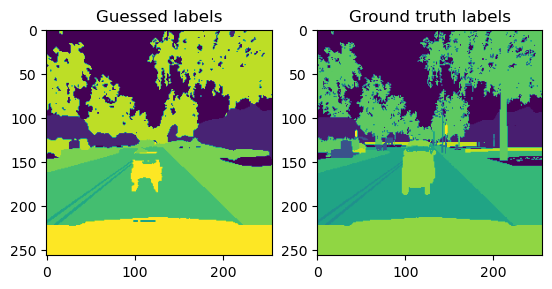

Epoch 65, loss:  0.7442569106817245
Epoch 65, validation loss:  0.7507978081703186


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

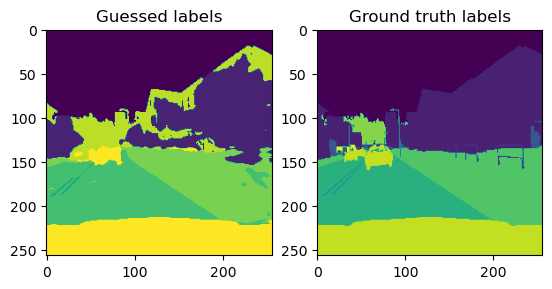

Epoch 66, loss:  0.7448633670806885
Epoch 66, validation loss:  0.7503060698509216


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

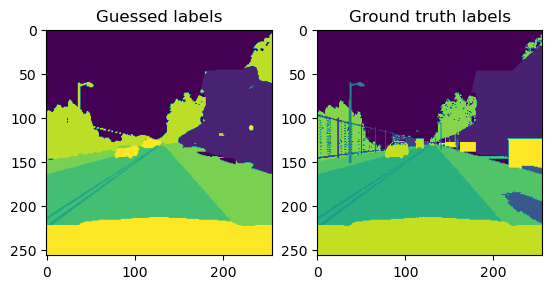

Epoch 67, loss:  0.7467312484979629
Epoch 67, validation loss:  0.749862790107727


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

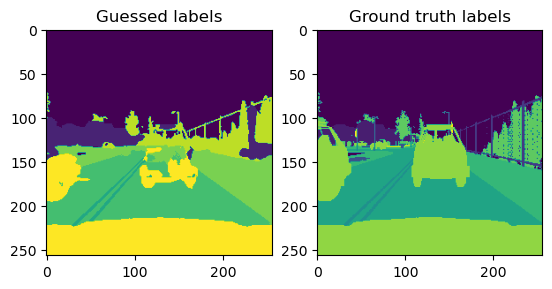

Epoch 68, loss:  0.7456218272447586
Epoch 68, validation loss:  0.7501174807548523


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

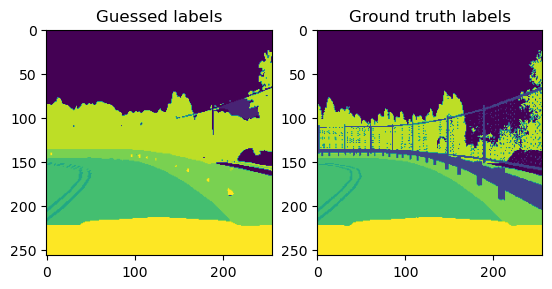

Epoch 69, loss:  0.7446802198886872
Epoch 69, validation loss:  0.7504949569702148


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

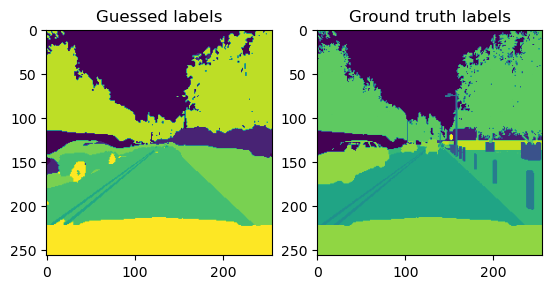

Epoch 70, loss:  0.7434997916221618
Epoch 70, validation loss:  0.7499760985374451


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

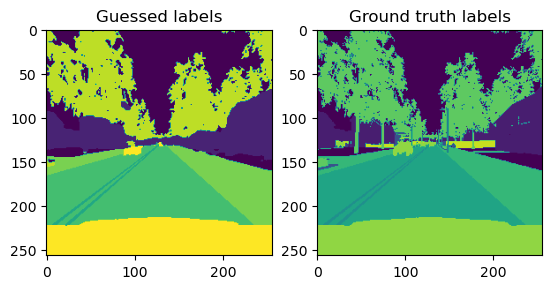

Epoch 71, loss:  0.7439237415790558
Epoch 71, validation loss:  0.7509430050849915


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

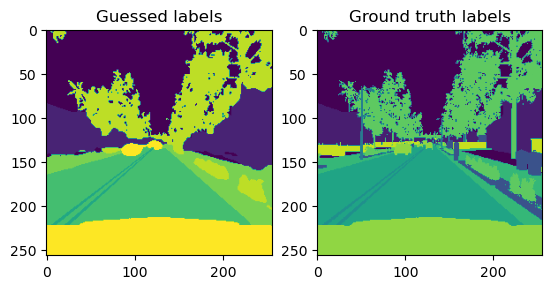

Epoch 72, loss:  0.7456359505653382
Epoch 72, validation loss:  0.7504203915596008


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

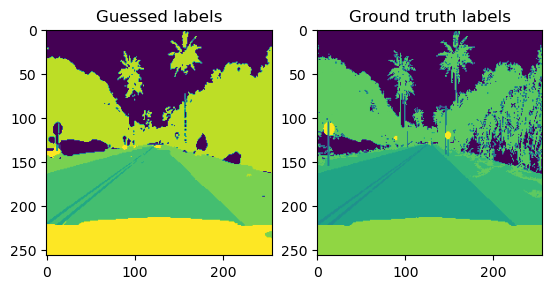

Epoch 73, loss:  0.7414828807115554
Epoch 73, validation loss:  0.752074122428894


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

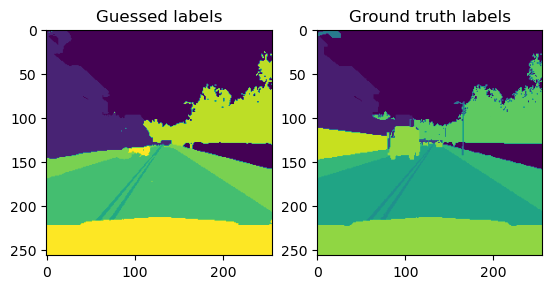

Epoch 74, loss:  0.7450259685516357
Epoch 74, validation loss:  0.7492213845252991


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

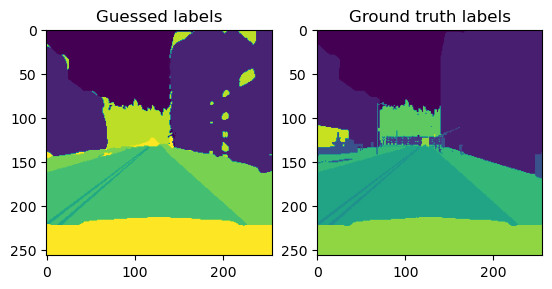

Epoch 75, loss:  0.7415119647979737
Epoch 75, validation loss:  0.7516128420829773


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

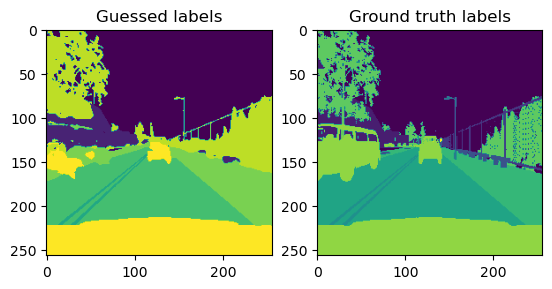

Epoch 76, loss:  0.7442472785711288
Epoch 76, validation loss:  0.7489355802536011


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

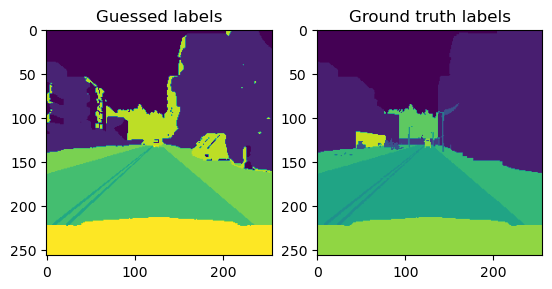

Epoch 77, loss:  0.744083970785141
Epoch 77, validation loss:  0.7488842010498047


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

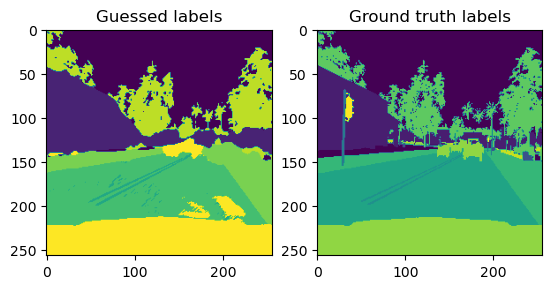

Epoch 78, loss:  0.7416063755750656
Epoch 78, validation loss:  0.749026894569397


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

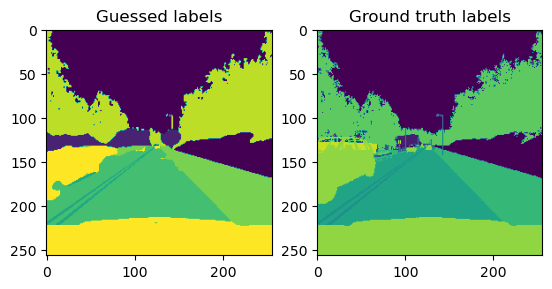

Epoch 79, loss:  0.7448940962553025
Epoch 79, validation loss:  0.7503488659858704


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

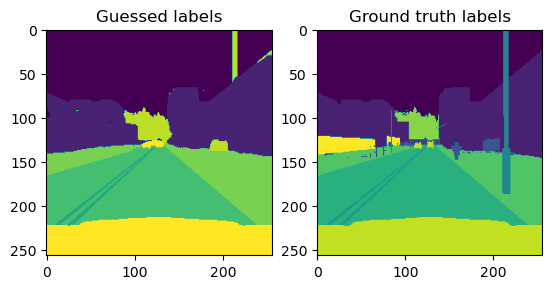

Epoch 80, loss:  0.7444035202264786
Epoch 80, validation loss:  0.7503496408462524


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

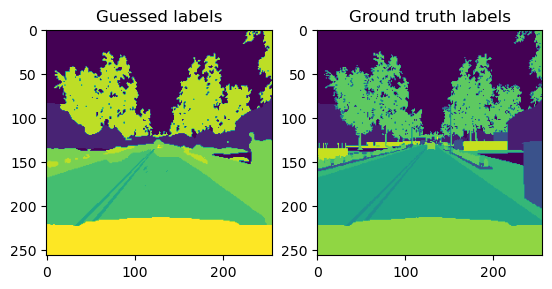

Epoch 81, loss:  0.7428092628717422
Epoch 81, validation loss:  0.7508872151374817


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

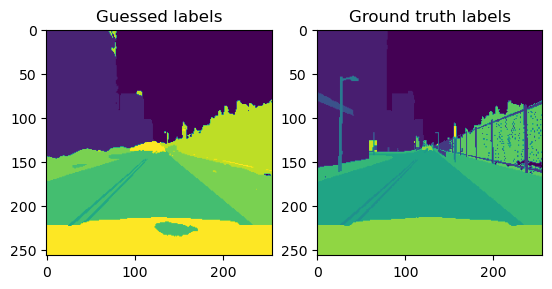

Epoch 82, loss:  0.7438468426465988
Epoch 82, validation loss:  0.748903214931488


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

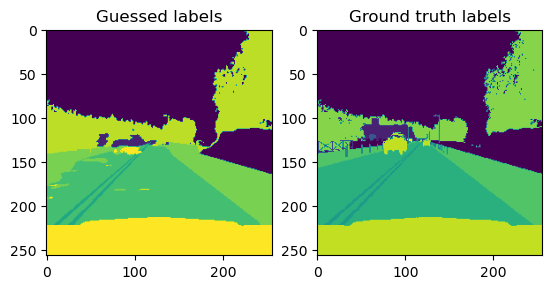

Epoch 83, loss:  0.7457859873771667
Epoch 83, validation loss:  0.7505186200141907


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

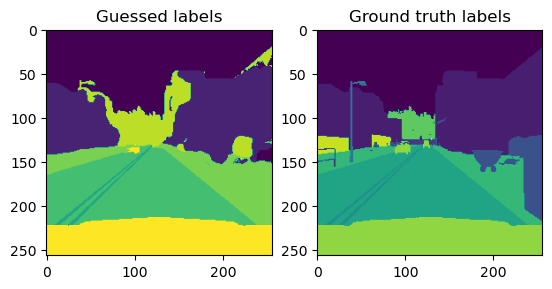

Epoch 84, loss:  0.7433995604515076
Epoch 84, validation loss:  0.7507774829864502


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

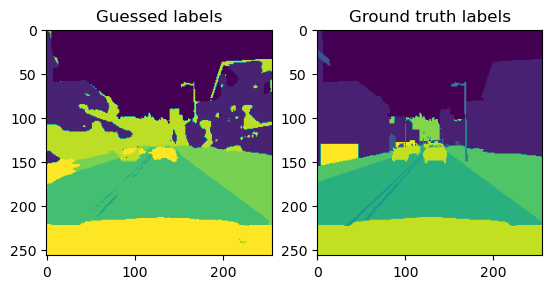

Epoch 85, loss:  0.7443044900894165
Epoch 85, validation loss:  0.7488849759101868


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

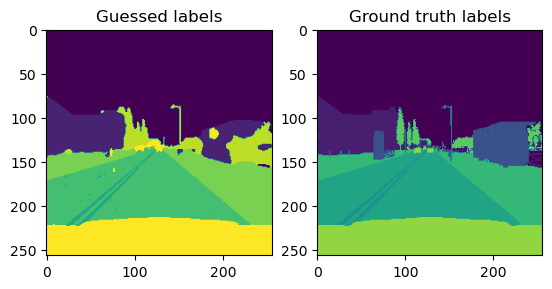

Epoch 86, loss:  0.7466427475214005
Epoch 86, validation loss:  0.7479173541069031


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

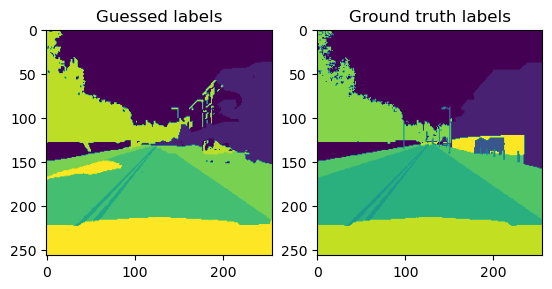

Epoch 87, loss:  0.7441952228546143
Epoch 87, validation loss:  0.7491689920425415


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

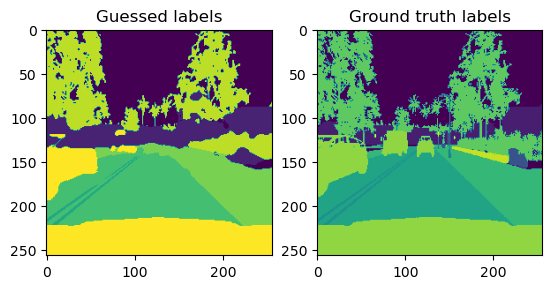

Epoch 88, loss:  0.7463418215513229
Epoch 88, validation loss:  0.749626636505127


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

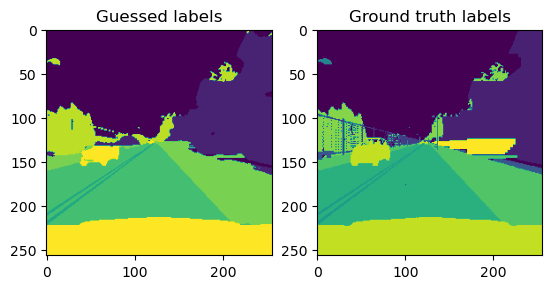

Epoch 89, loss:  0.741953295469284
Epoch 89, validation loss:  0.7491910457611084


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

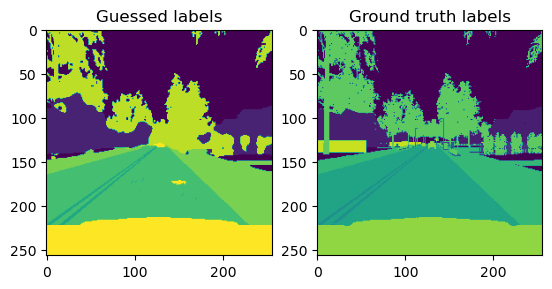

Epoch 90, loss:  0.7407942056655884
Epoch 90, validation loss:  0.7487637996673584


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

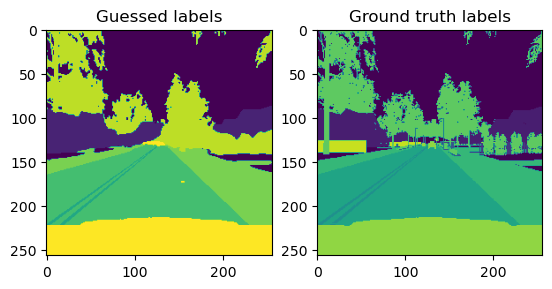

Epoch 91, loss:  0.7419088363647461
Epoch 91, validation loss:  0.7504297494888306


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

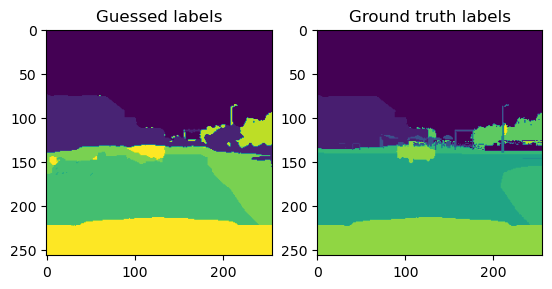

Epoch 92, loss:  0.7403782278299331
Epoch 92, validation loss:  0.751293420791626


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

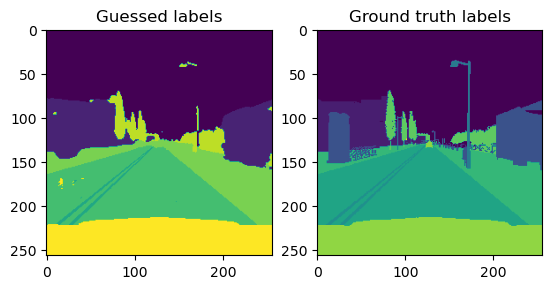

Epoch 93, loss:  0.7428788870573044
Epoch 93, validation loss:  0.7493885159492493


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

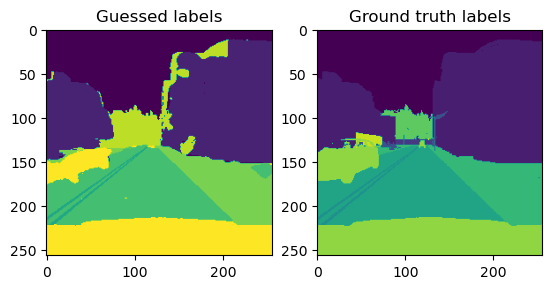

Epoch 94, loss:  0.7430288434028626
Epoch 94, validation loss:  0.7485263347625732


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

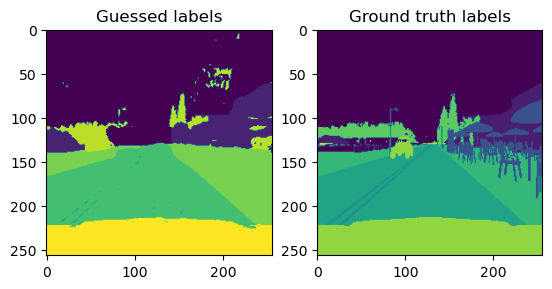

Epoch 95, loss:  0.7410119622945786
Epoch 95, validation loss:  0.7496772408485413


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

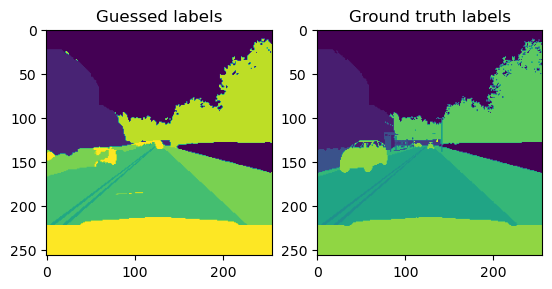

Epoch 96, loss:  0.7427643209695816
Epoch 96, validation loss:  0.7485732436180115


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

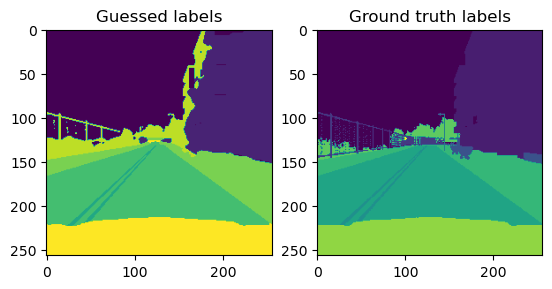

Epoch 97, loss:  0.7420901745557785
Epoch 97, validation loss:  0.7480253577232361


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

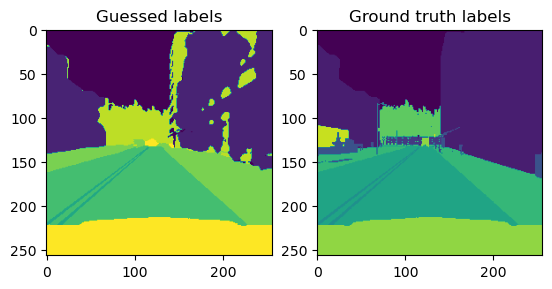

Epoch 98, loss:  0.7441069811582566
Epoch 98, validation loss:  0.7497172951698303


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

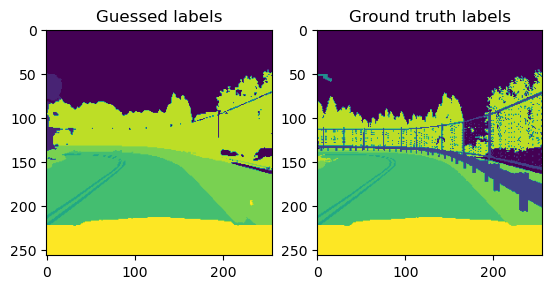

Epoch 99, loss:  0.7429245322942734
Epoch 99, validation loss:  0.7483406066894531


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

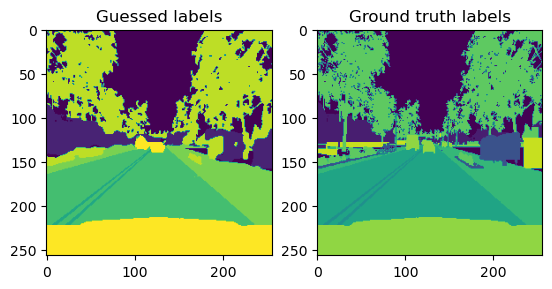

Epoch 100, loss:  0.740848234295845
Epoch 100, validation loss:  0.7486289143562317


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

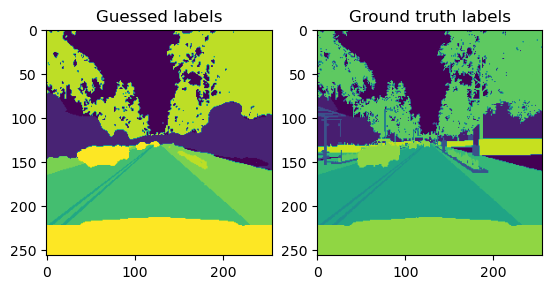

<Figure size 640x480 with 0 Axes>

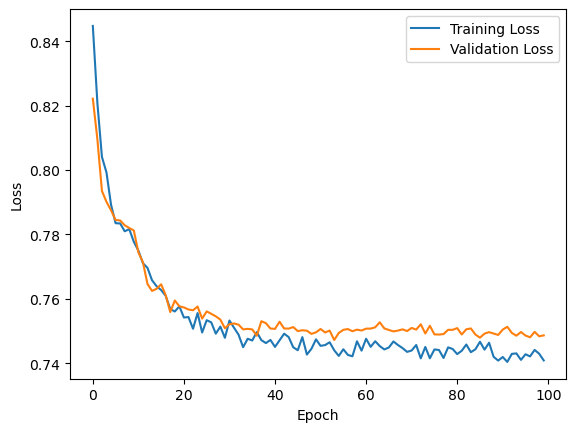

<Figure size 640x480 with 0 Axes>

In [57]:
losses = []
val_losses = [] 
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)

for epoch in range(100):
    running_loss = 0.0
    epoch_loss = []
    for i, data in enumerate(train_data_loader, 0):
        inputs, labels = data
        inputs = inputs.cuda()
        labels = labels.cuda()
        
        optimizer.zero_grad()
        outputs = model(inputs[0].permute(1, 0, 2, 3))
        loss = dice_loss(outputs, labels[0, 0, :, :, :])
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        epoch_loss.append(loss.item())
    
    losses.append(np.mean(epoch_loss))
    print(f'Epoch {epoch+1}, loss: ', np.mean(epoch_loss))
    
    # Validation phase
    val_loss = []
    with torch.no_grad():
        for i, data in enumerate(val_data_loader, 0):
            inputs, labels = data
            inputs = inputs.cuda()
            labels = labels.cuda()
            val_outputs = model(val_inputs[0].permute(1, 0, 2, 3))
            val_loss.append(dice_loss(val_outputs, val_labels[0, 0, :, :, :]).item())
    val_losses.append(np.mean(val_loss))
    print(f'Epoch {epoch+1}, validation loss: ', np.mean(val_loss))
    
    # Visualization and plotting
    samp = np.random.randint(low=0, high=len(test_data)-1, size=1)[0]
    test = model(test_data[samp][0].permute(1, 0, 2, 3).cuda())
    truth = test_data[samp][1].cuda()
    original_image = test_data[samp][0].cuda()
    
    plt.figure()
    f, axarr = plt.subplots(1, 2) 
    axarr[0].imshow(torch.argmax(test.squeeze(), dim=0).detach().cpu().numpy())
    axarr[0].set_title('Guessed labels')
    axarr[1].imshow(truth.detach().cpu().numpy()[0, 0, :, :])
    axarr[1].set_title('Ground truth labels')
    plt.show()
    plt.gcf().show()

# Plotting losses
plt.figure()
plt.plot(losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
plt.gcf().show()


# Plotting Training and validation loss

In [58]:
epochs_ = list(range(0,100))

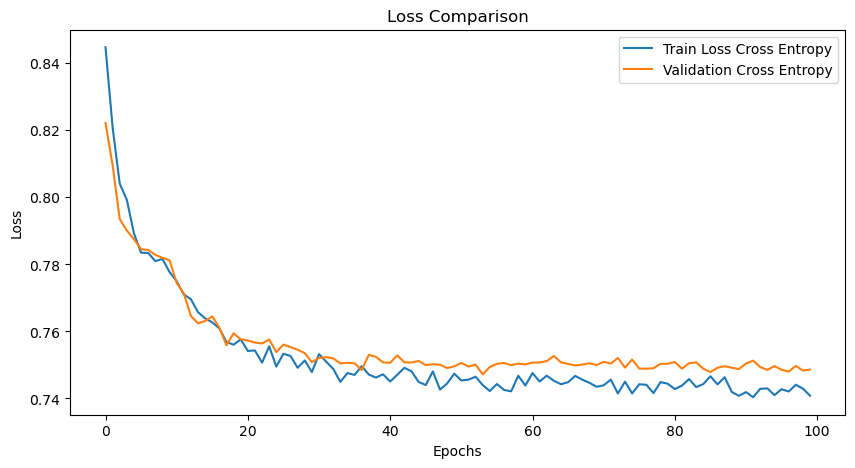

In [59]:
plt.figure(figsize=(10, 5))
plt.plot(epochs_, losses, label='Train Loss Cross Entropy')
plt.plot(epochs_, val_losses, label='Validation Cross Entropy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Comparison')
plt.legend()
plt.show()

In [60]:
import pickle
model_path = '/kaggle/working/rkhatik_final_project_DiceLoss.pickle'
with open(model_path, 'wb') as file:
    pickle.dump(model, file)
print("Model saved successfully.")


Model saved successfully.


# Pretrained ResNet34 UNet Model

In [64]:
!pip install segmentation_models_pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=18f003aadd617bb56989778793c07aa6cb1ca347b208f6e31d2159073e7be6a9
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60966 sha256=829182838fa0256e1a71ee6aced581e47f578abda0a2b17d287cad3203032ed5
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytorch pretrainedmodels


In [65]:
import segmentation_models_pytorch as smp
model = model.float()
model = model.cuda()
model 

UNet(
  (encoder1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (encoder2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
  )
  (encoder3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=T

Epoch 1, loss:  0.8182893037796021
Epoch 1, validation loss:  0.8020266890525818


<Figure size 640x480 with 0 Axes>

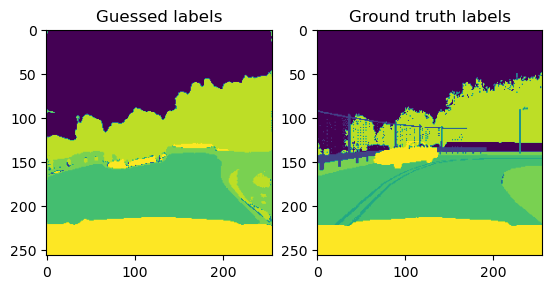

Epoch 2, loss:  0.8062640935182571
Epoch 2, validation loss:  0.795900821685791


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

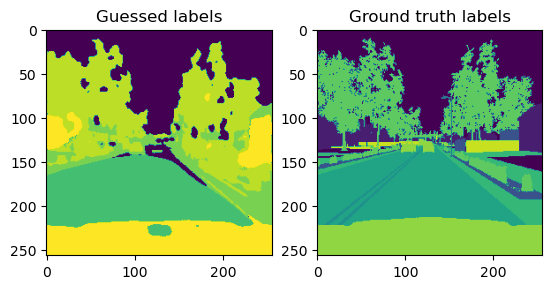

Epoch 3, loss:  0.7940430223941803
Epoch 3, validation loss:  0.7855715155601501


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

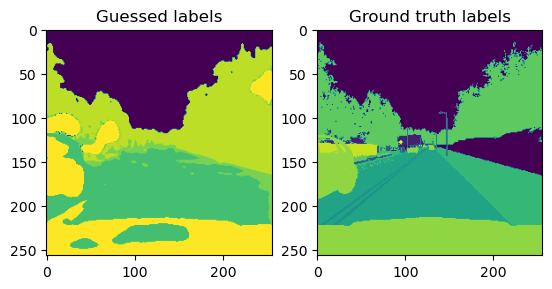

Epoch 4, loss:  0.7882234066724777
Epoch 4, validation loss:  0.7809113264083862


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

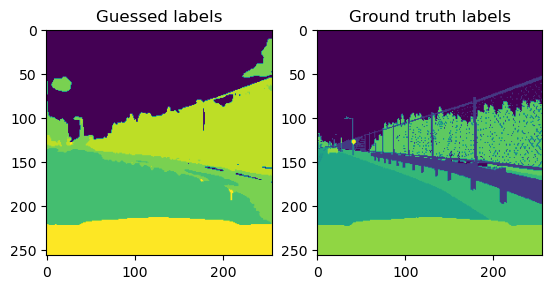

Epoch 5, loss:  0.7823775947093964
Epoch 5, validation loss:  0.780331552028656


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

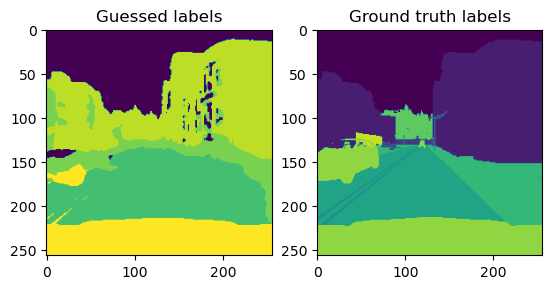

Epoch 6, loss:  0.7820091307163238
Epoch 6, validation loss:  0.7797325253486633


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

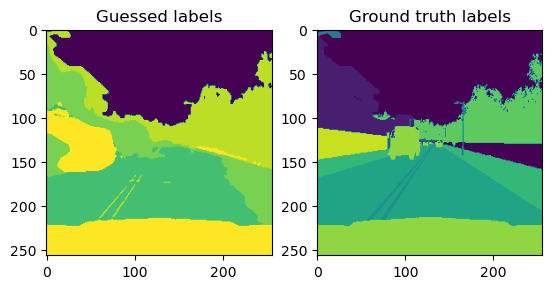

Epoch 7, loss:  0.7778936326503754
Epoch 7, validation loss:  0.7724822163581848


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

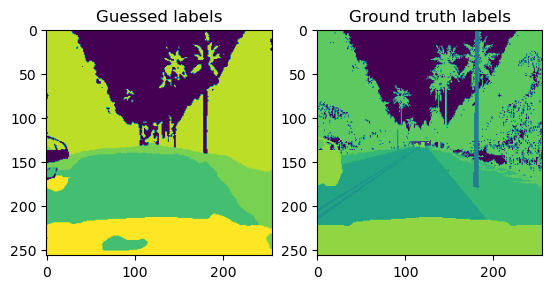

Epoch 8, loss:  0.7725699752569198
Epoch 8, validation loss:  0.7699987292289734


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

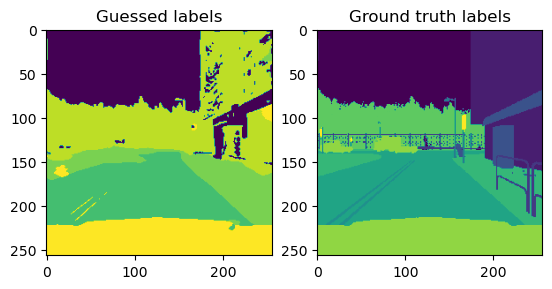

Epoch 9, loss:  0.7682018518447876
Epoch 9, validation loss:  0.7669100761413574


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

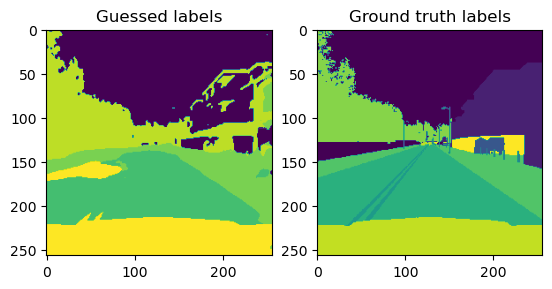

Epoch 10, loss:  0.7687319278717041
Epoch 10, validation loss:  0.7652043104171753


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

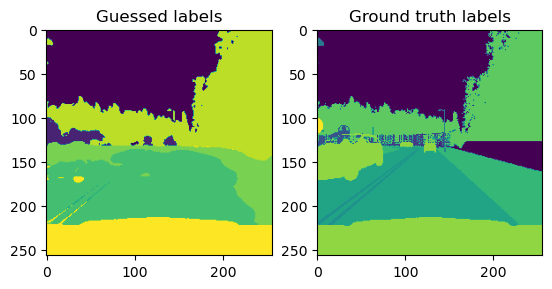

Epoch 11, loss:  0.7647002816200257
Epoch 11, validation loss:  0.7625941038131714


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

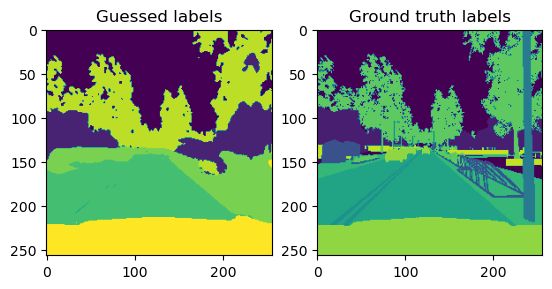

Epoch 12, loss:  0.7569597631692886
Epoch 12, validation loss:  0.7599578499794006


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

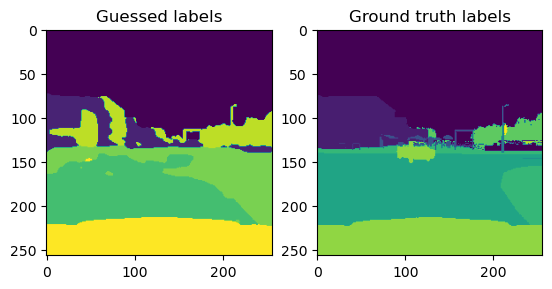

Epoch 13, loss:  0.7610882937908172
Epoch 13, validation loss:  0.7620193958282471


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

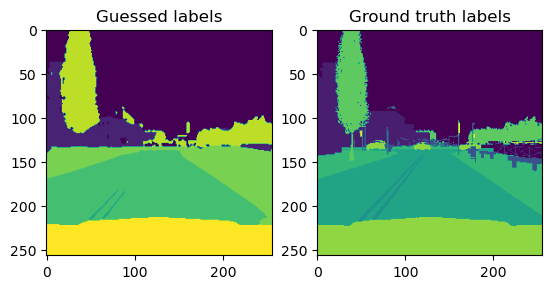

Epoch 14, loss:  0.7620855927467346
Epoch 14, validation loss:  0.7624267935752869


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

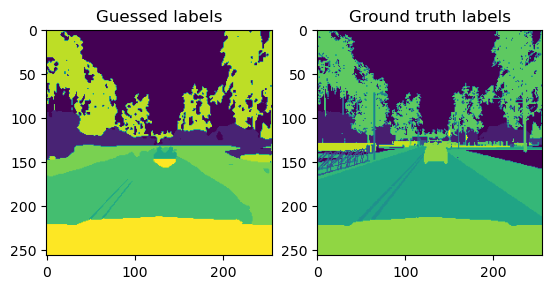

Epoch 15, loss:  0.7553039699792862
Epoch 15, validation loss:  0.758309543132782


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

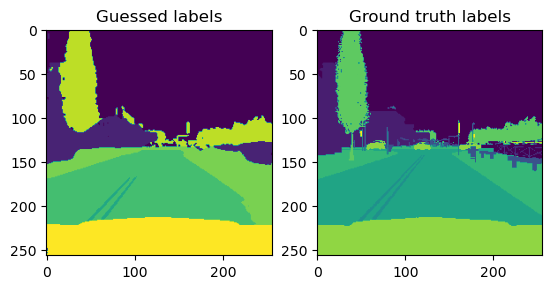

Epoch 16, loss:  0.7579233258962631
Epoch 16, validation loss:  0.7584292888641357


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

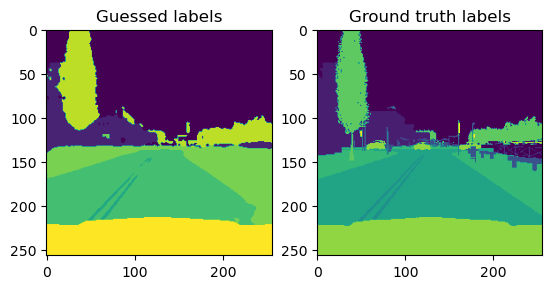

Epoch 17, loss:  0.7506718218326569
Epoch 17, validation loss:  0.7594691514968872


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

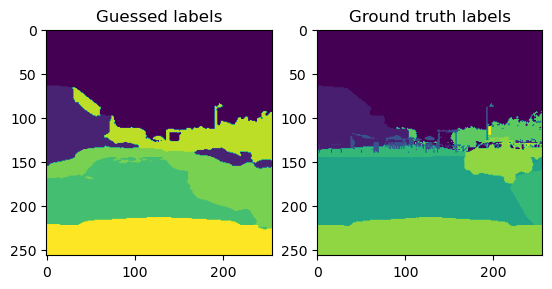

Epoch 18, loss:  0.752035278081894
Epoch 18, validation loss:  0.7559117674827576


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

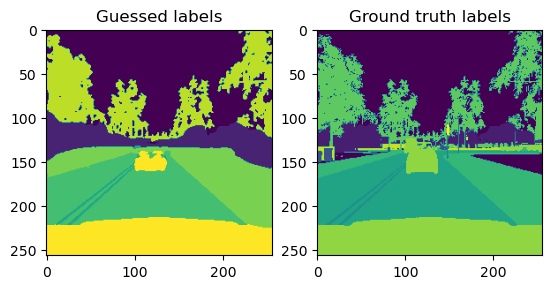

Epoch 19, loss:  0.7500725120306015
Epoch 19, validation loss:  0.7563531398773193


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

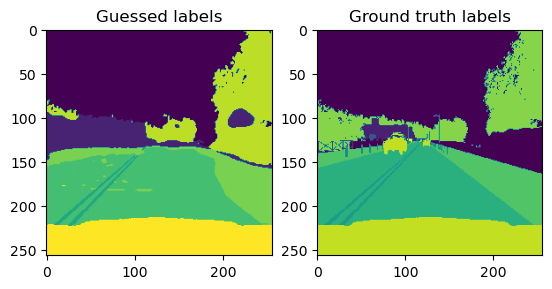

Epoch 20, loss:  0.752016007900238
Epoch 20, validation loss:  0.7626190185546875


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

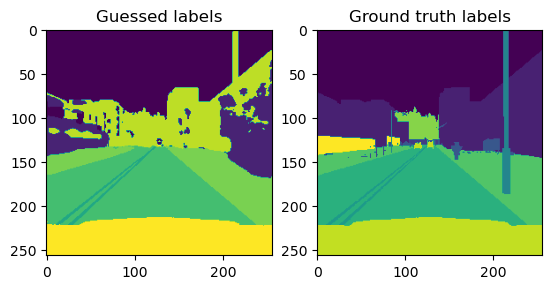

Epoch 21, loss:  0.7552714854478836
Epoch 21, validation loss:  0.7587888240814209


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

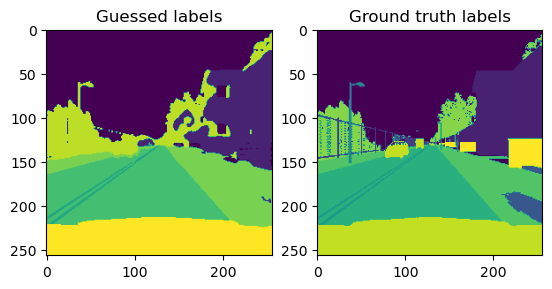

Epoch 22, loss:  0.749865648150444
Epoch 22, validation loss:  0.7555766701698303


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

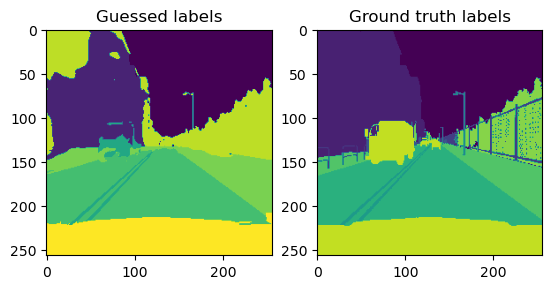

Epoch 23, loss:  0.7529205203056335
Epoch 23, validation loss:  0.7568952441215515


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

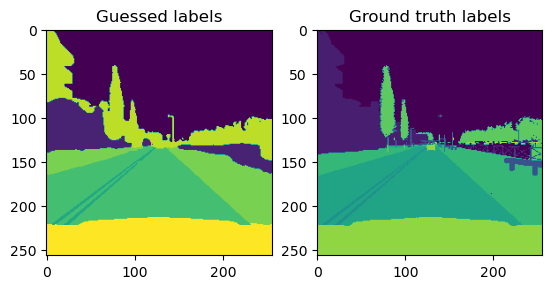

Epoch 24, loss:  0.7482625544071198
Epoch 24, validation loss:  0.7565532326698303


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

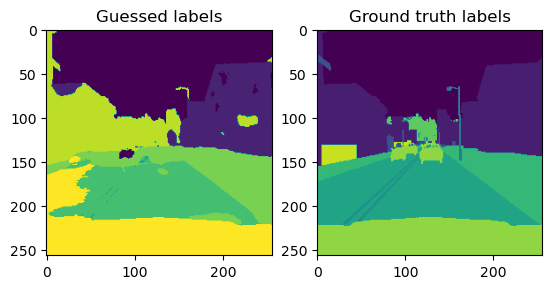

Epoch 25, loss:  0.7532094925642013
Epoch 25, validation loss:  0.757992684841156


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

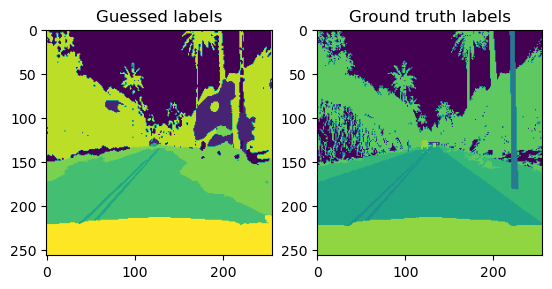

Epoch 26, loss:  0.7488321751356125
Epoch 26, validation loss:  0.7558207511901855


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

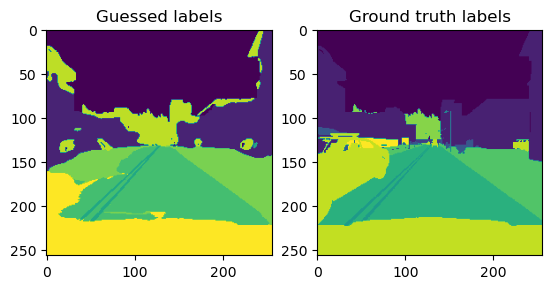

Epoch 27, loss:  0.7505977630615235
Epoch 27, validation loss:  0.7549695372581482


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

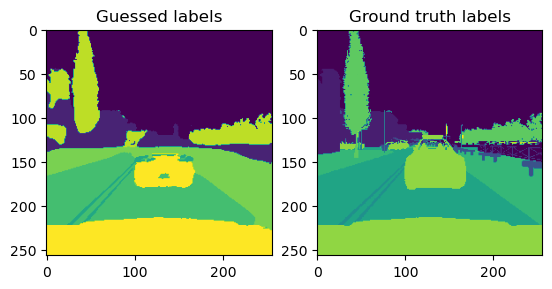

Epoch 28, loss:  0.7476608604192734
Epoch 28, validation loss:  0.753865659236908


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

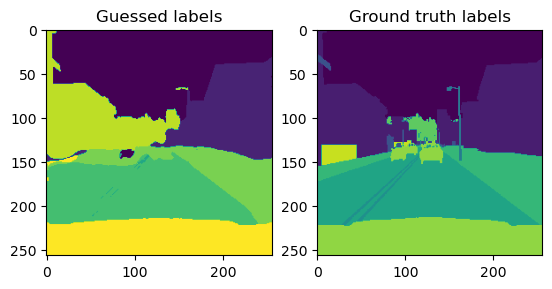

Epoch 29, loss:  0.7494790583848954
Epoch 29, validation loss:  0.7536292672157288


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

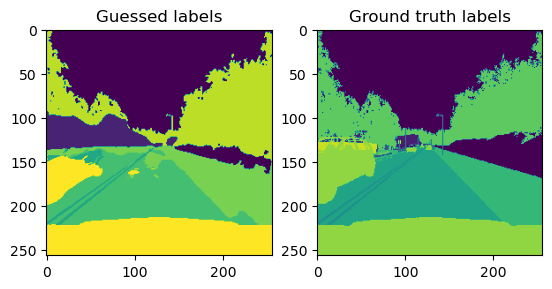

Epoch 30, loss:  0.7474749654531478
Epoch 30, validation loss:  0.7543379068374634


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

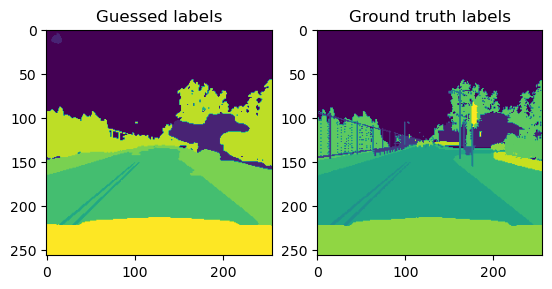

Epoch 31, loss:  0.7484638035297394
Epoch 31, validation loss:  0.7554495930671692


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

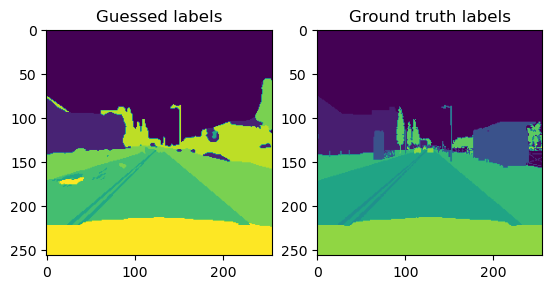

Epoch 32, loss:  0.7458242535591125
Epoch 32, validation loss:  0.7546557188034058


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

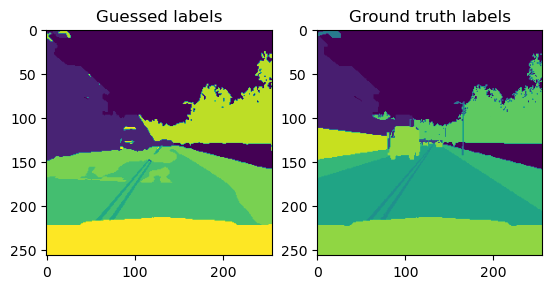

Epoch 33, loss:  0.7479371905326844
Epoch 33, validation loss:  0.7537728548049927


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

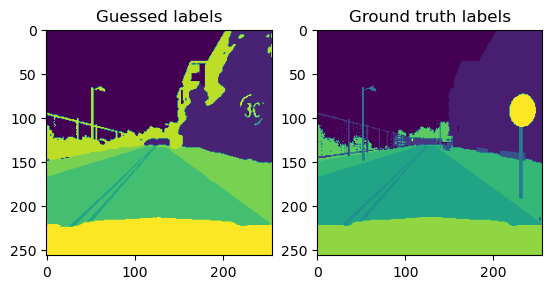

Epoch 34, loss:  0.7443429410457612
Epoch 34, validation loss:  0.7543405890464783


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

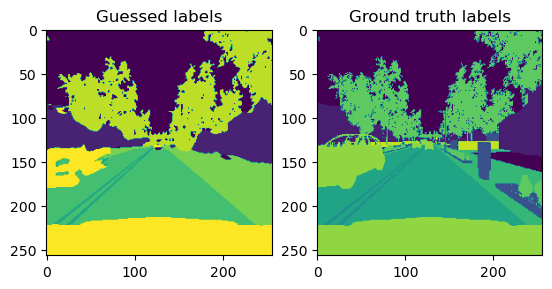

Epoch 35, loss:  0.7471215426921844
Epoch 35, validation loss:  0.7529897689819336


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

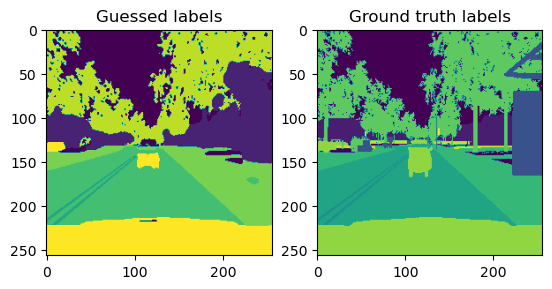

Epoch 36, loss:  0.7480614870786667
Epoch 36, validation loss:  0.7528100609779358


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

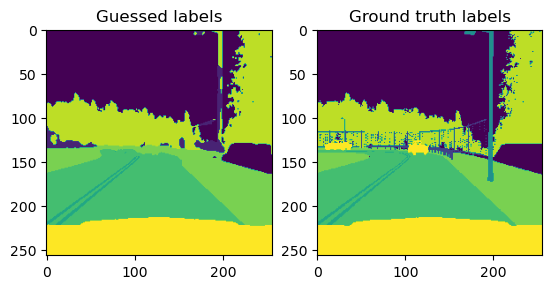

Epoch 37, loss:  0.7458464831113816
Epoch 37, validation loss:  0.7519381642341614


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

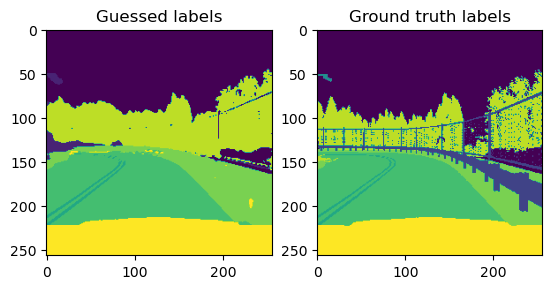

Epoch 38, loss:  0.7500401586294174
Epoch 38, validation loss:  0.7547817230224609


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

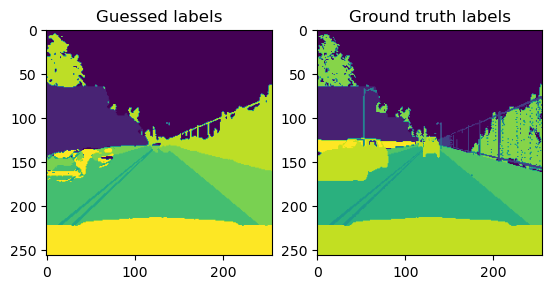

Epoch 39, loss:  0.7503981947898865
Epoch 39, validation loss:  0.7520043849945068


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

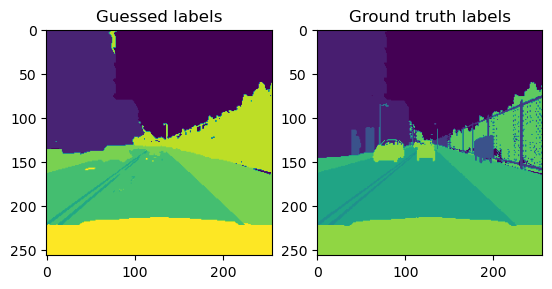

Epoch 40, loss:  0.7451793044805527
Epoch 40, validation loss:  0.7527949810028076


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

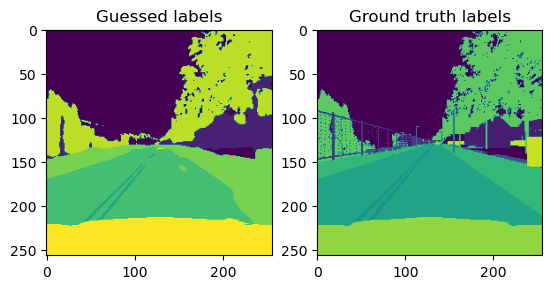

Epoch 41, loss:  0.7454327464103698
Epoch 41, validation loss:  0.7530274391174316


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

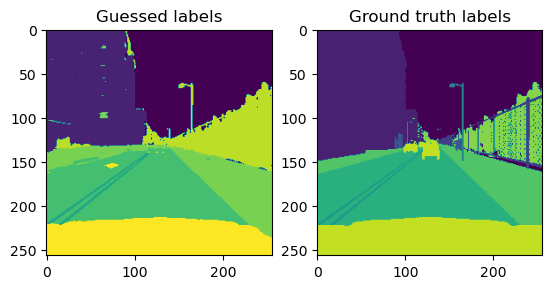

Epoch 42, loss:  0.7485921591520309
Epoch 42, validation loss:  0.7536885738372803


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

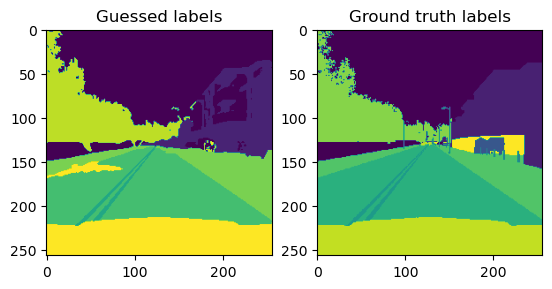

Epoch 43, loss:  0.7447465687990189
Epoch 43, validation loss:  0.753534197807312


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

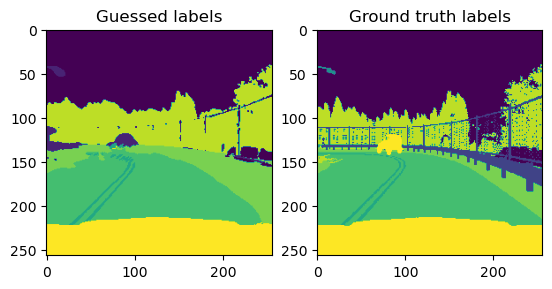

Epoch 44, loss:  0.7466936528682708
Epoch 44, validation loss:  0.751369297504425


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

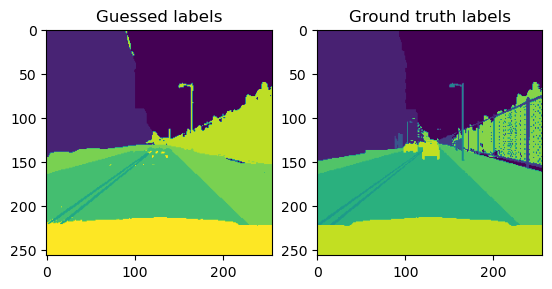

Epoch 45, loss:  0.7445579588413238
Epoch 45, validation loss:  0.7533577680587769


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

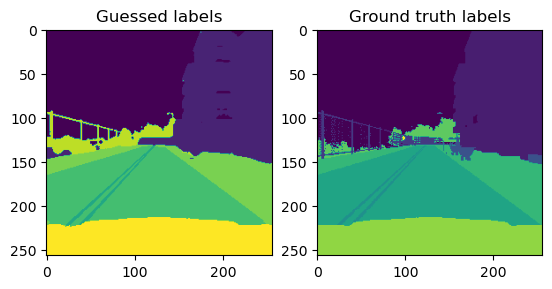

Epoch 46, loss:  0.7467849224805831
Epoch 46, validation loss:  0.7523382902145386


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

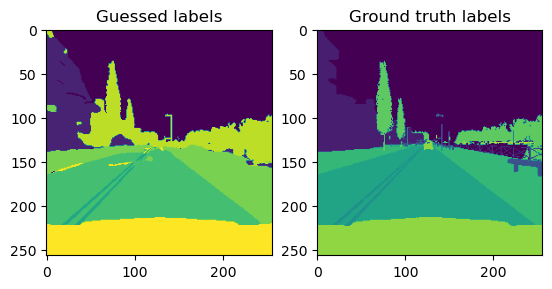

Epoch 47, loss:  0.7467596083879471
Epoch 47, validation loss:  0.7515569925308228


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

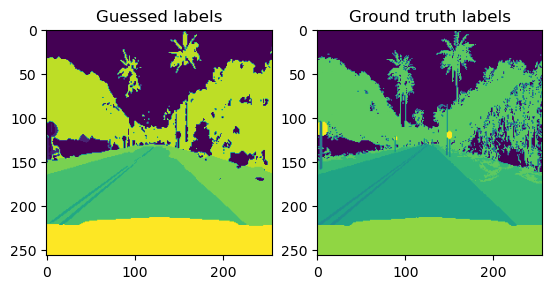

Epoch 48, loss:  0.7423510193824768
Epoch 48, validation loss:  0.7538034319877625


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

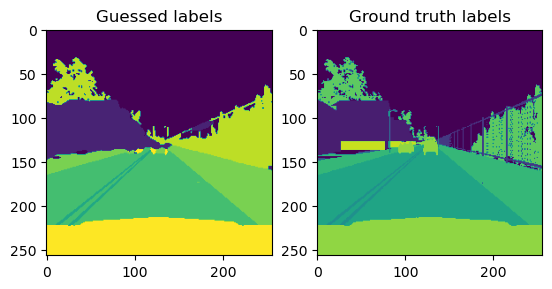

Epoch 49, loss:  0.7421200722455978
Epoch 49, validation loss:  0.7532904744148254


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

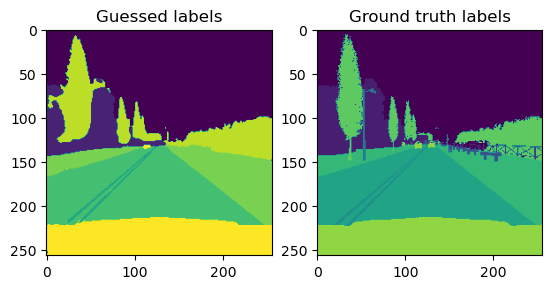

Epoch 50, loss:  0.7441686481237412
Epoch 50, validation loss:  0.7526403665542603


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

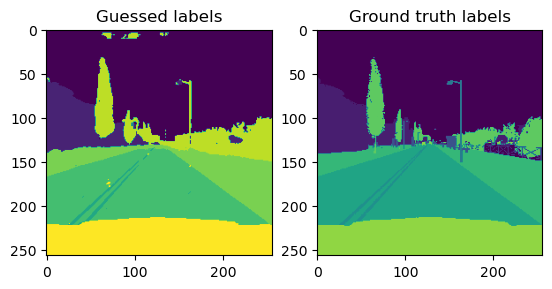

Epoch 51, loss:  0.7425696283578873
Epoch 51, validation loss:  0.7488611340522766


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

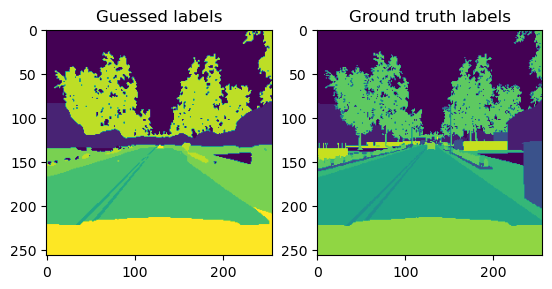

Epoch 52, loss:  0.7433582961559295
Epoch 52, validation loss:  0.7495376467704773


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

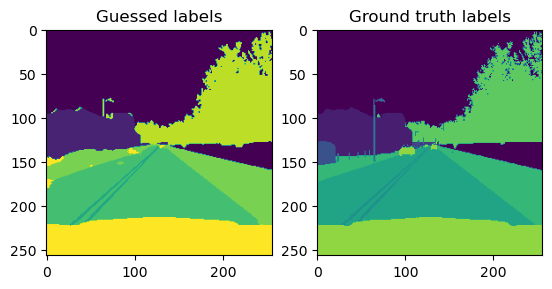

Epoch 53, loss:  0.7490507423877716
Epoch 53, validation loss:  0.7529580593109131


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

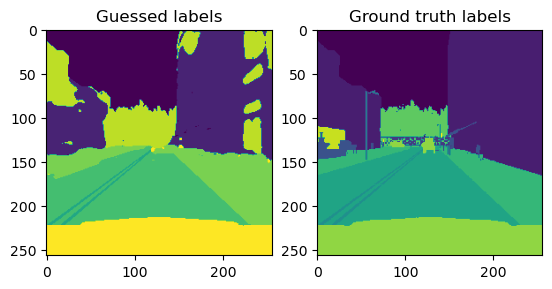

Epoch 54, loss:  0.743891128897667
Epoch 54, validation loss:  0.7511385679244995


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

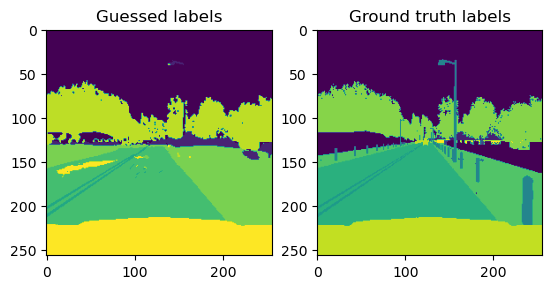

Epoch 55, loss:  0.745738509297371
Epoch 55, validation loss:  0.748980700969696


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

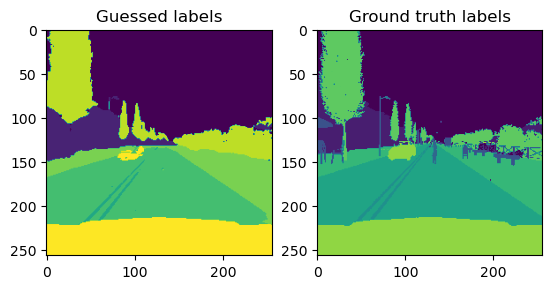

Epoch 56, loss:  0.7433906227350235
Epoch 56, validation loss:  0.7522697448730469


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

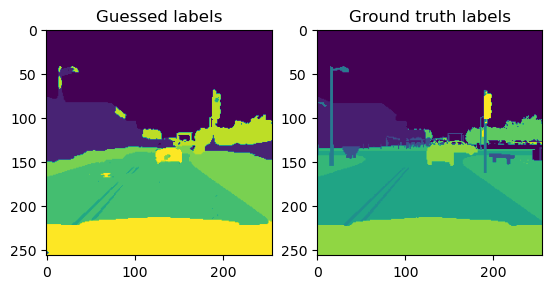

Epoch 57, loss:  0.7455591052770615
Epoch 57, validation loss:  0.7521783709526062


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

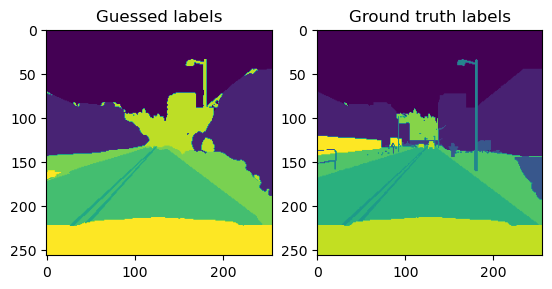

Epoch 58, loss:  0.7488780438899993
Epoch 58, validation loss:  0.7505679130554199


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

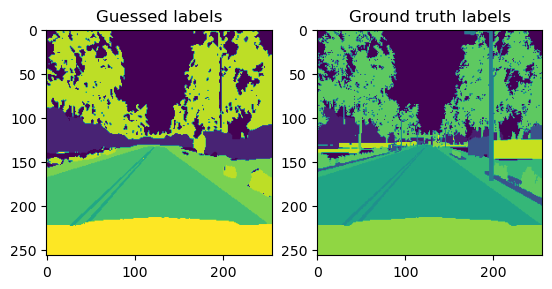

Epoch 59, loss:  0.7453409403562545
Epoch 59, validation loss:  0.7518629431724548


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

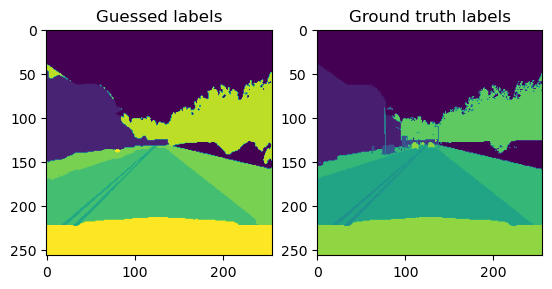

Epoch 60, loss:  0.7475159585475921
Epoch 60, validation loss:  0.7496225237846375


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

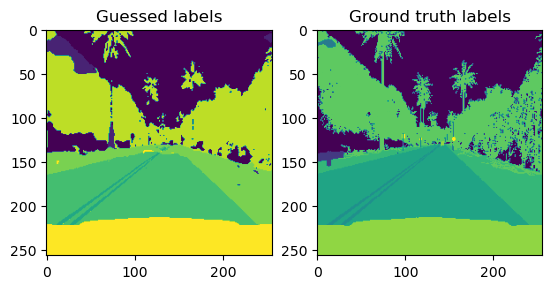

Epoch 61, loss:  0.747173061966896
Epoch 61, validation loss:  0.7522603869438171


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

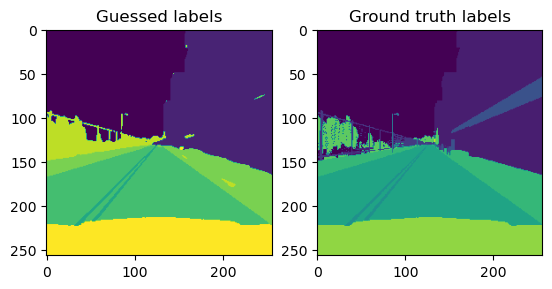

Epoch 62, loss:  0.7418624043464661
Epoch 62, validation loss:  0.7520907521247864


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

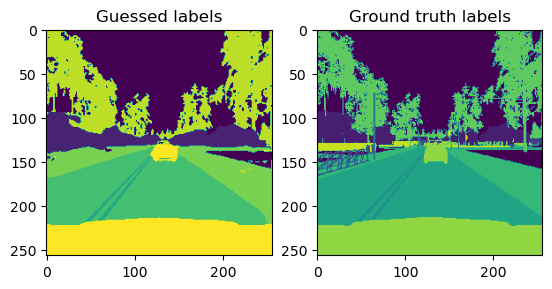

Epoch 63, loss:  0.7502441436052323
Epoch 63, validation loss:  0.7514164447784424


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

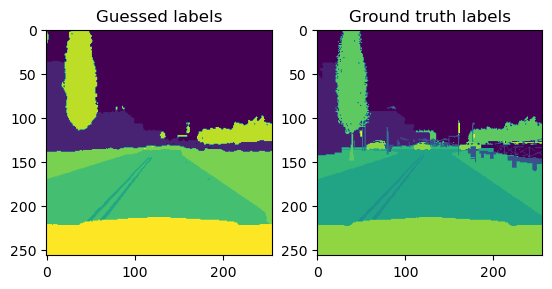

Epoch 64, loss:  0.7462051600217819
Epoch 64, validation loss:  0.749515175819397


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

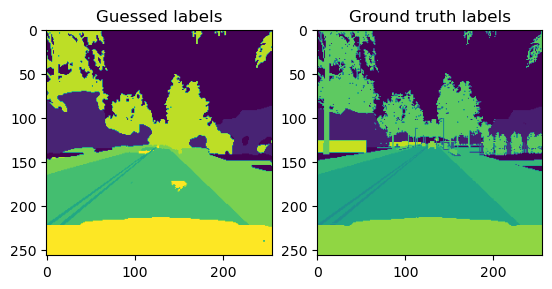

Epoch 65, loss:  0.7469397902488708
Epoch 65, validation loss:  0.7513009309768677


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

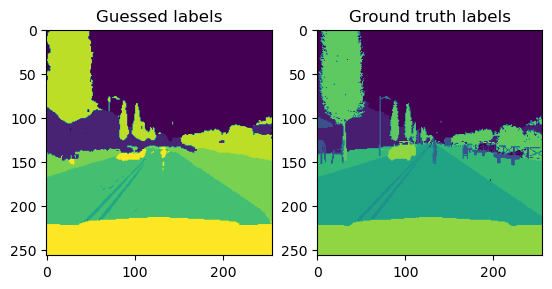

Epoch 66, loss:  0.7444647759199142
Epoch 66, validation loss:  0.7510383725166321


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

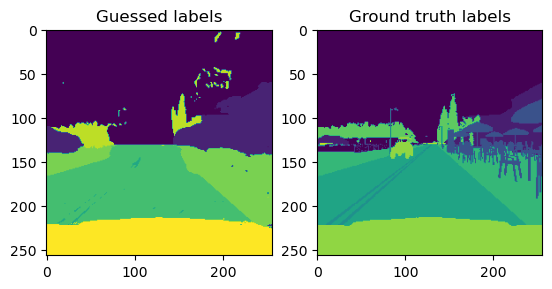

Epoch 67, loss:  0.7402608454227447
Epoch 67, validation loss:  0.7490891814231873


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

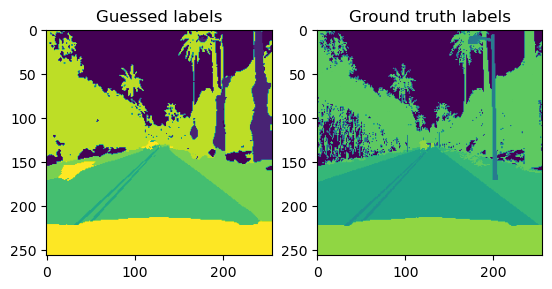

Epoch 68, loss:  0.7443387866020202
Epoch 68, validation loss:  0.7495440244674683


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

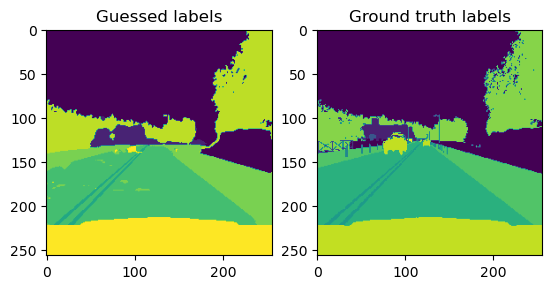

Epoch 69, loss:  0.7456827610731125
Epoch 69, validation loss:  0.7491113543510437


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

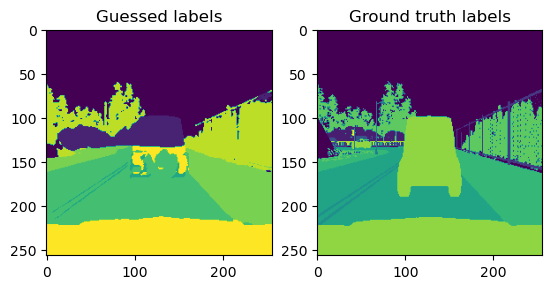

Epoch 70, loss:  0.7430997312068939
Epoch 70, validation loss:  0.749465823173523


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

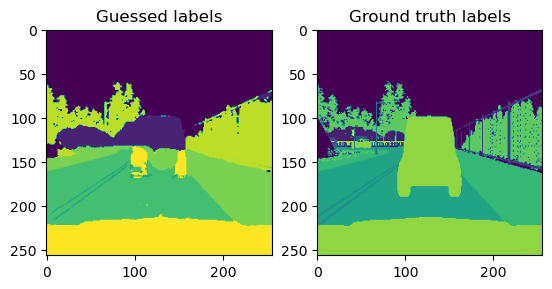

Epoch 71, loss:  0.7446642756462097
Epoch 71, validation loss:  0.7489060759544373


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

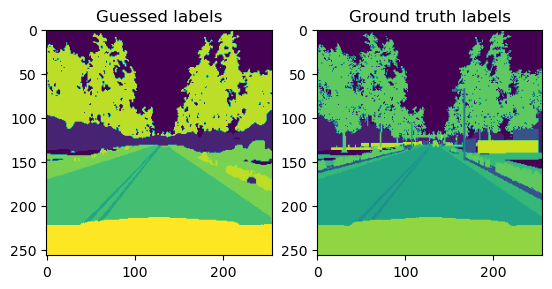

Epoch 72, loss:  0.7455109655857086
Epoch 72, validation loss:  0.7511133551597595


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

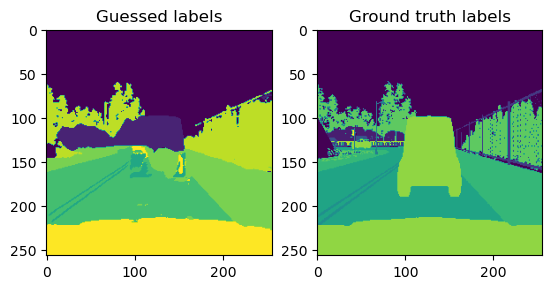

Epoch 73, loss:  0.7465868860483169
Epoch 73, validation loss:  0.7503888607025146


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

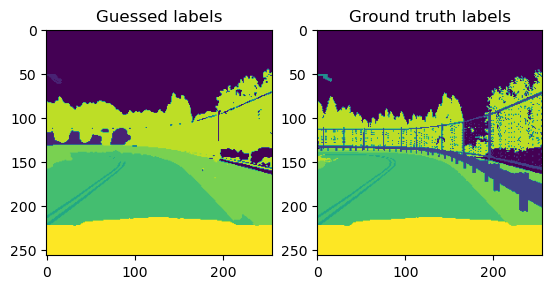

Epoch 74, loss:  0.7448539674282074
Epoch 74, validation loss:  0.7516778111457825


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

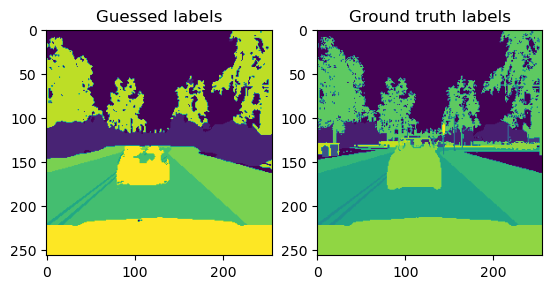

Epoch 75, loss:  0.7463682740926743
Epoch 75, validation loss:  0.7511060237884521


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

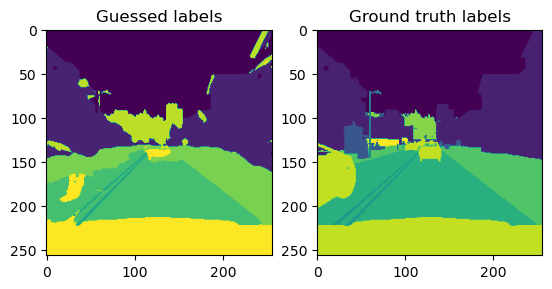

Epoch 76, loss:  0.7421634912490844
Epoch 76, validation loss:  0.750198245048523


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

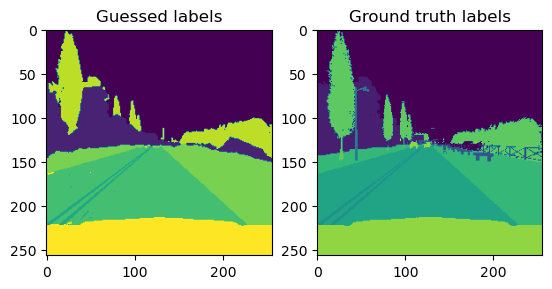

Epoch 77, loss:  0.7421528846025467
Epoch 77, validation loss:  0.7492534518241882


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

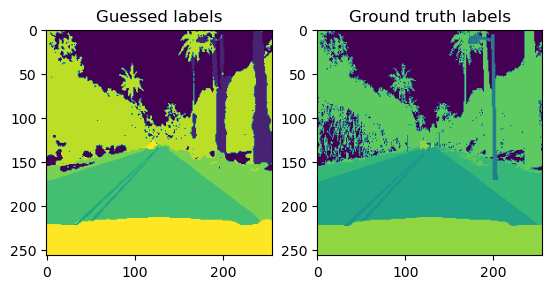

Epoch 78, loss:  0.7411649823188782
Epoch 78, validation loss:  0.7491708993911743


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

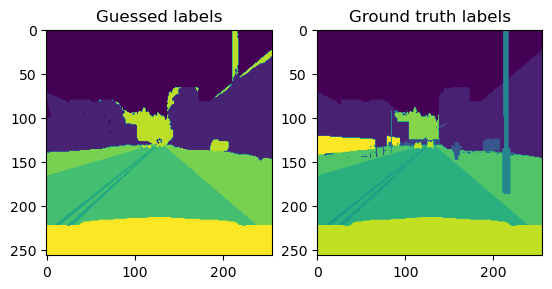

Epoch 79, loss:  0.7429292261600494
Epoch 79, validation loss:  0.7494071125984192


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

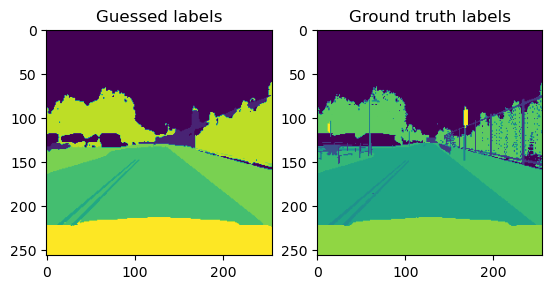

Epoch 80, loss:  0.7443608909845352
Epoch 80, validation loss:  0.7489538192749023


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

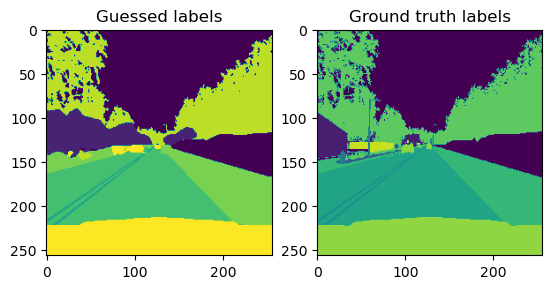

Epoch 81, loss:  0.7390005886554718
Epoch 81, validation loss:  0.7527932524681091


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

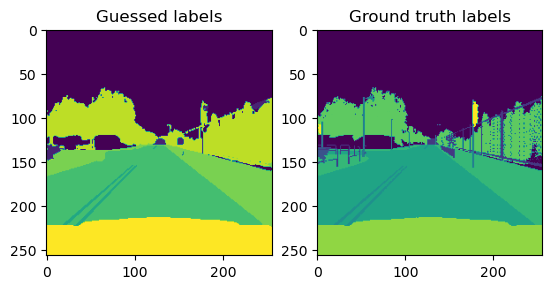

Epoch 82, loss:  0.7449504226446152
Epoch 82, validation loss:  0.7495942115783691


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

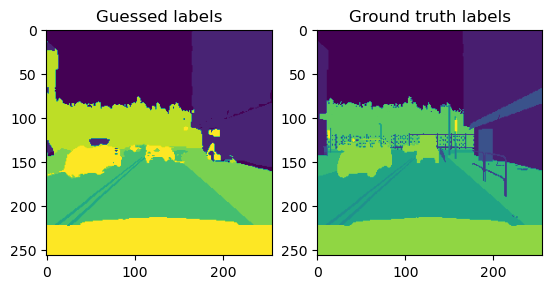

Epoch 83, loss:  0.7454636514186859
Epoch 83, validation loss:  0.7493088245391846


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

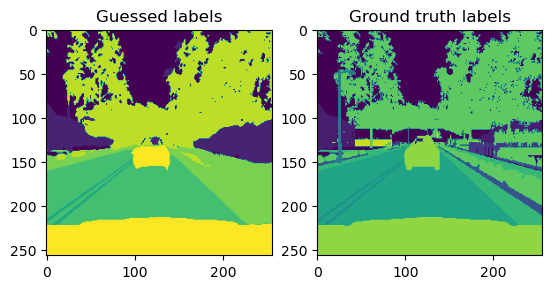

Epoch 84, loss:  0.7420335471630096
Epoch 84, validation loss:  0.7493682503700256


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

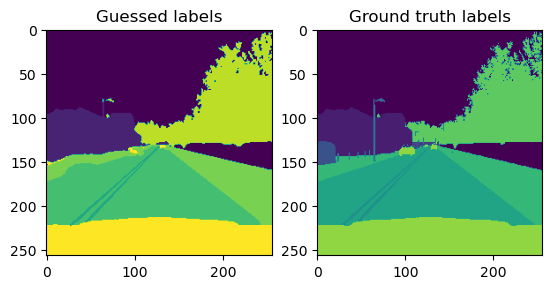

Epoch 85, loss:  0.7446985900402069
Epoch 85, validation loss:  0.7482362985610962


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

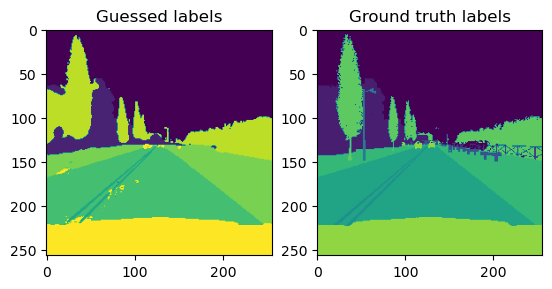

Epoch 86, loss:  0.7417265564203263
Epoch 86, validation loss:  0.7519788146018982


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

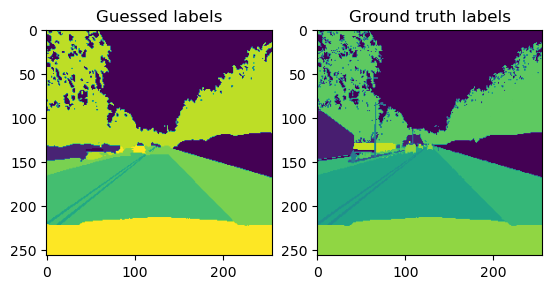

Epoch 87, loss:  0.7447315722703933
Epoch 87, validation loss:  0.7508304715156555


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

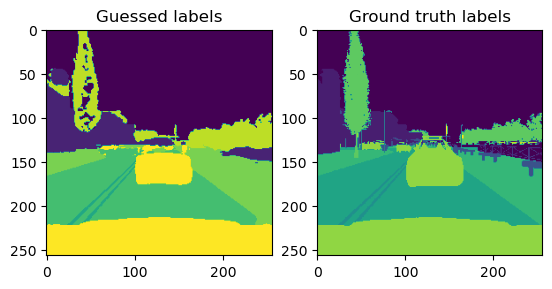

Epoch 88, loss:  0.7506995469331741
Epoch 88, validation loss:  0.7492734789848328


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

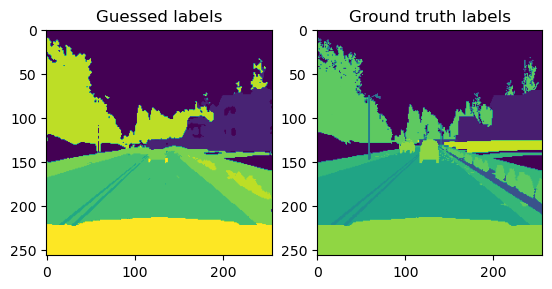

Epoch 89, loss:  0.7469632774591446
Epoch 89, validation loss:  0.7501392364501953


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

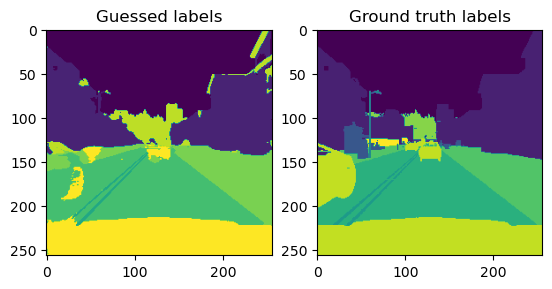

Epoch 90, loss:  0.7444694012403488
Epoch 90, validation loss:  0.7501291632652283


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

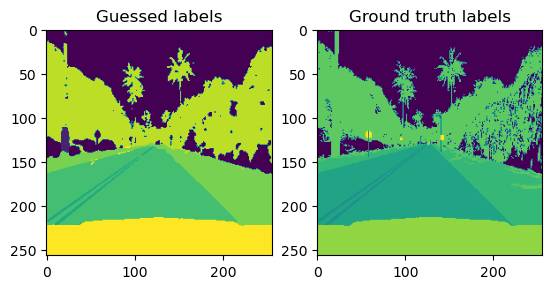

Epoch 91, loss:  0.7411839842796326
Epoch 91, validation loss:  0.7492198944091797


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

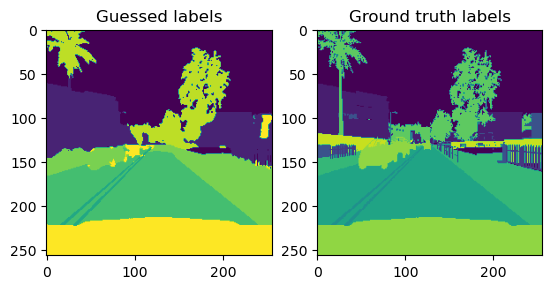

Epoch 92, loss:  0.7410456001758575
Epoch 92, validation loss:  0.747917652130127


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

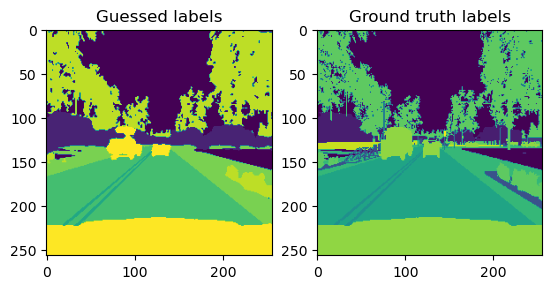

Epoch 93, loss:  0.7456007599830627
Epoch 93, validation loss:  0.7494757771492004


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

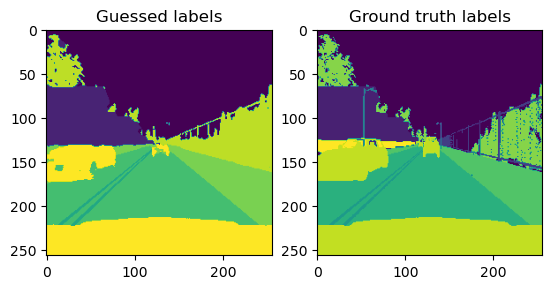

Epoch 94, loss:  0.7459898591041565
Epoch 94, validation loss:  0.749457597732544


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

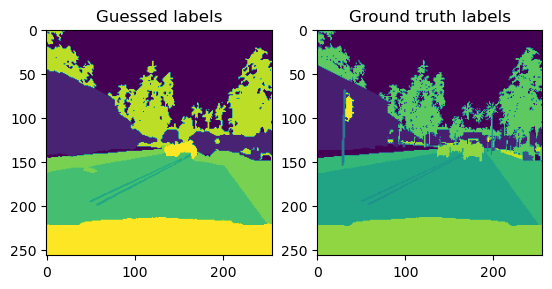

Epoch 95, loss:  0.7393711000680924
Epoch 95, validation loss:  0.7508372068405151


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

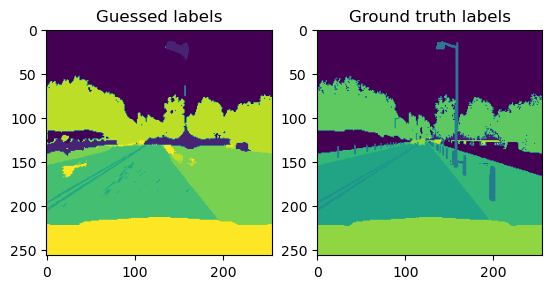

Epoch 96, loss:  0.7432534128427506
Epoch 96, validation loss:  0.7497283220291138


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

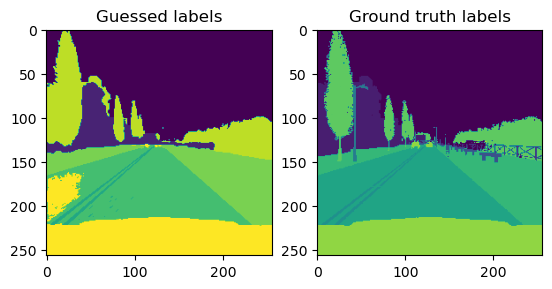

Epoch 97, loss:  0.7408809989690781
Epoch 97, validation loss:  0.7490115761756897


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

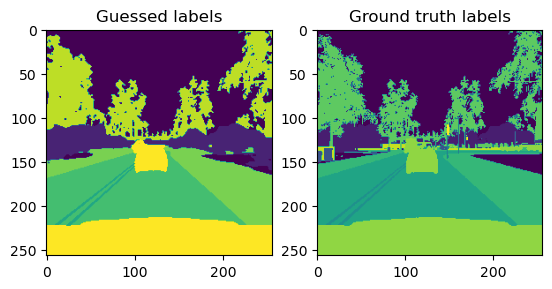

Epoch 98, loss:  0.7423124641180039
Epoch 98, validation loss:  0.7488580346107483


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

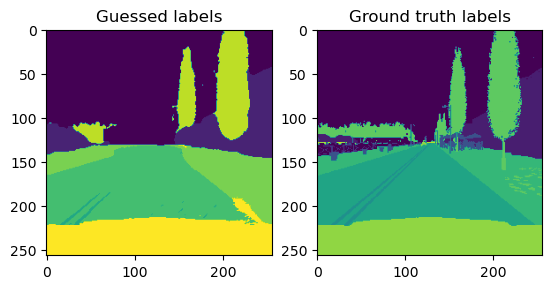

Epoch 99, loss:  0.7425502449274063
Epoch 99, validation loss:  0.7479065656661987


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

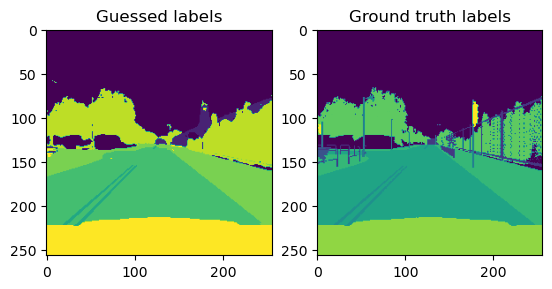

Epoch 100, loss:  0.7455451488494873
Epoch 100, validation loss:  0.7488870024681091


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

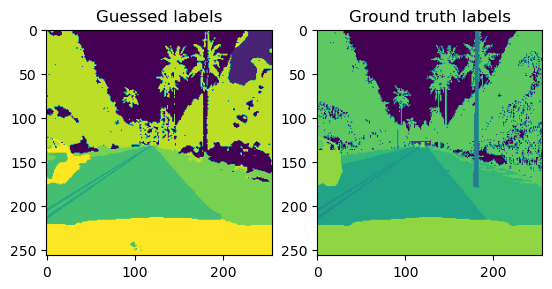

<Figure size 640x480 with 0 Axes>

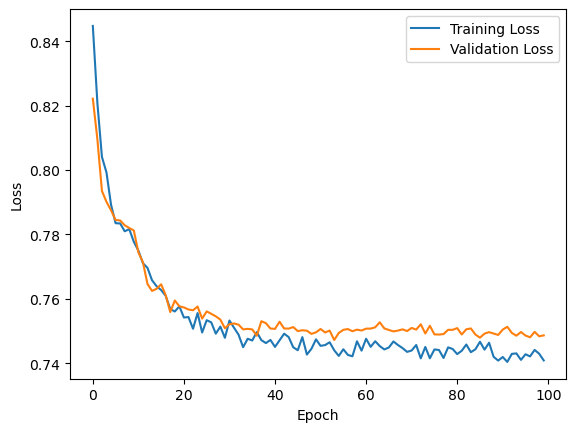

<Figure size 640x480 with 0 Axes>

In [67]:
ResNetlosses = []
ResNetval_losses = [] 
optimizer = torch.optim.Adam(model.parameters(), lr=0.0005)

for epoch in range(100):
    running_loss = 0.0
    epoch_loss = []
    for i, data in enumerate(train_data_loader, 0):
        inputs, labels = data
        inputs = inputs.cuda()
        labels = labels.cuda()
        
        optimizer.zero_grad()
        outputs = model(inputs[0].permute(1, 0, 2, 3))
        loss = dice_loss(outputs, labels[0, 0, :, :, :])
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()
        epoch_loss.append(loss.item())
    
    ResNetlosses.append(np.mean(epoch_loss))
    print(f'Epoch {epoch+1}, loss: ', np.mean(epoch_loss))
    
    # Validation phase
    ResNetval_loss = []
    with torch.no_grad():
        for i, data in enumerate(val_data_loader, 0):
            inputs, labels = data
            inputs = inputs.cuda()
            labels = labels.cuda()
            val_outputs = model(val_inputs[0].permute(1, 0, 2, 3))
            ResNetval_loss.append(dice_loss(val_outputs, val_labels[0, 0, :, :, :]).item())
    ResNetval_losses.append(np.mean(ResNetval_loss))
    print(f'Epoch {epoch+1}, validation loss: ', np.mean(ResNetval_loss))
    
    # Visualization and plotting
    samp = np.random.randint(low=0, high=len(test_data)-1, size=1)[0]
    test = model(test_data[samp][0].permute(1, 0, 2, 3).cuda())
    truth = test_data[samp][1].cuda()
    original_image = test_data[samp][0].cuda()
    
    plt.figure()
    f, axarr = plt.subplots(1, 2) 
    axarr[0].imshow(torch.argmax(test.squeeze(), dim=0).detach().cpu().numpy())
    axarr[0].set_title('Guessed labels')
    axarr[1].imshow(truth.detach().cpu().numpy()[0, 0, :, :])
    axarr[1].set_title('Ground truth labels')
    plt.show()
    plt.gcf().show()

# Plotting losses
plt.figure()
plt.plot(losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()
plt.gcf().show()


In [68]:
import pickle
model_path = '/kaggle/working/rkhatik_final_project_ResNet34backbone.pickle'
with open(model_path, 'wb') as file:
    pickle.dump(model, file)
print("Model saved successfully.")

Model saved successfully.


# Plot comparison

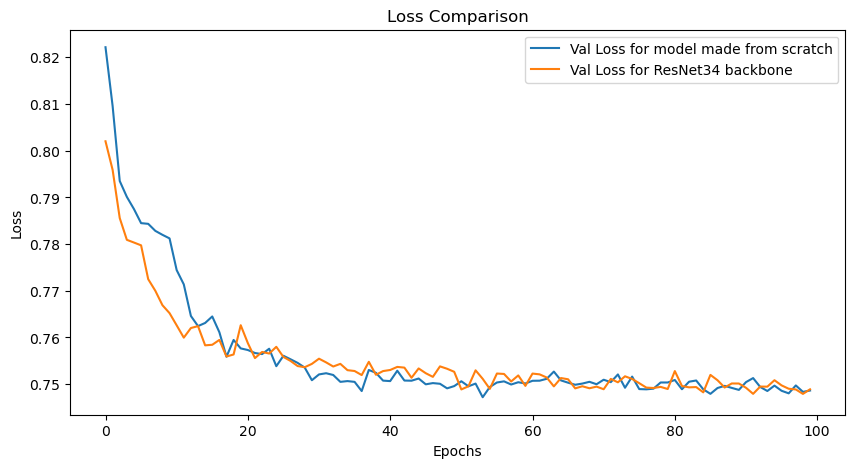

In [69]:
plt.figure(figsize=(10, 5))
plt.plot(epochs_, val_losses, label='Val Loss for model made from scratch')
plt.plot(epochs_, ResNetval_losses, label='Val Loss for ResNet34 backbone')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Comparison')
plt.legend()
plt.show()